<a href="https://colab.research.google.com/github/iuricimatec/bci/blob/main/EEGSinalsFundamentals20240123.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **EEG Motor Movement/Imagery Dataset**

In [1]:
# install required libraries to manipulate dataset
!pip install mne
!pip install pyriemann

In [2]:
import mne
import numpy as np
from scipy.signal import welch
import matplotlib.pyplot as plt


# First, Google Drive libraries are required to read the file within EEG
# Connect to GDrive
import os
import re
from google.colab import drive


drive.mount('gdrive')
# root_directory = '/content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb'
# print(os.listdir(root_directory))

Drive already mounted at gdrive; to attempt to forcibly remount, call drive.mount("gdrive", force_remount=True).


Os graficos dos sinais EEG por canal, de cada rodada, de cada um dos dez individuos, foram anexados na sessão Anexo deste documento.


#**Questões:**


**O sinal é confiável?**

Para garantir a confiabilidade dos dados de exames EEG são necessárias algumas considerações, incluindo a qualidade não somente de dados, mas também de hardware, ambiente, contexto e as caracteríticas do indivíduo no qual a coleta foi realizada.  

Além disso, também são necessárias as etapas de pré-processamento de dados, treinamento e aplicação de modelos matemáticos e estatísticos com os dados digitalizados respetivos ao sinal coletado. Não menos importante, a adesão a padrões experimentais e éticos, como por exemplo: o método EEG não invasivo, o consentimento dos pacientes, a anonimização de dados, entre outros aspectos.

Alguns deles são importantes, e devem ser considerados ao avaliar a confiabilidade dos dados das coletas de EEG.  Neste documento foram apresentados alguns aspectos e conceitos a fim de esclarecer e elucidar os requisitos e recursos fundamentais para se obter uma confiabilidade aceitável dos resultados.

A qualidade e aquisição de dados através de um sensor de boa qualidade é condição e razão "cinequanon" ao experimento. Torna-se imprescindível então, a certeza de que os sensores EEG sejam de alta qualidade e estejam devidamente calibrados e dispostos corretamente no couro cabeludo.

Na documentação do experimento realizado pela BCI2000, embora exista informação suficiente sobre os dados, não há especificação alguma acerca de uma instrumentação, equipamentos e/ou materiais utilizados no experimento. Apenas asssume-me que os mesmos estão em conformidade ao exigido pela comunidade científica, devido ao respaldo dos institutos de pesquisa científica envolvidos no programa.


Ainda em relação à confiabilidade dos dados BCI2000, uma das primeiras evidências extraídas foi a identificação da taxa de amostragem dos sinais. Deve-se verificar se os dados de EEG foram registrados numa taxa de amostragem apropriada para capturar informações de frequência relevantes.
[BATISTIC, L., 2023]

Embora verificada, A taxa de amostragem de 160 Hertz por segundo, na dpcumentação e especificação dos dados, disponivel no site BCI2000, os arquivos apresentam dados com taxas de amostragem distintas. Conforme evidencia apresentada no item Anexo, deste texto.

Além disso, conforme sugerido em [DÍAZ, 2008], que imagéticas motoras (MI) tem componentes básicos semelhantes ao movimento físico, foram  filtrados os sinais das rodadas 3,4,7,8,11,12, que correspondem aos sinais de intenção de movimento e o movimento real, aos pares.


O codigo abaixo, na liguagem de programação Python, cria uma lista de arquivos chamada edf_files[], e adiciona cada arquivo, apenas das rodadas descritas acima, de cada indíviduo.


In [3]:
# another approach with conditional to load only files with determined sampling rate 160

from mne.io import concatenate_raws, read_raw_edf

# Collect all EDF files from subdirectories
# root_directory = '/content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidbmini'
root_directory = '/content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb'
edf_files = []
for subject_folder in os.listdir(root_directory):
    subject_path = os.path.join(root_directory, subject_folder)

    if os.path.isdir(subject_path):
      subject_edf_files = [
          os.path.join(subject_path, file)
          for file in os.listdir(subject_path)
          if file.endswith(".edf") and len(re.findall('S.*R03|R04|R07|R08|R11|R12', file)) > 0
      ]

      # check the sampling rate if the first file
      if subject_edf_files:
        ref_sfreq = read_raw_edf(subject_edf_files[0], preload=False).info['sfreq']
        print('Sampling rate', ref_sfreq)
        # check the sampling rate of the rest of the files
        consistent_sampling_rate = all(
            read_raw_edf(file, preload=False).info['sfreq'] == ref_sfreq
            for file in subject_edf_files[1:]

        )
        if consistent_sampling_rate:
          edf_files.extend(subject_edf_files)
        else:
          print(f"Skipping subject {subject_folder} due to inconsistent sampling rates.")

Extracting EDF parameters from /content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/S075/S075R03.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Sampling rate 160.0
Extracting EDF parameters from /content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/S075/S075R04.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Extracting EDF parameters from /content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/S075/S075R07.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Extracting EDF parameters from /content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/S075/S075R08.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Extracting EDF parameters from /content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/S075/S075R11.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Extracting EDF parameters from /content/gdrive/MyDrive/BKP/T

<ipython-input-3-2b3db2da396a>:21: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  ref_sfreq = read_raw_edf(subject_edf_files[0], preload=False).info['sfreq']
<ipython-input-3-2b3db2da396a>:25: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  read_raw_edf(file, preload=False).info['sfreq'] == ref_sfreq
<ipython-input-3-2b3db2da396a>:25: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  read_raw_edf(file, preload=False).info['sfreq'] == ref_sfreq
<ipython-input-3-2b3db2da396a>:25: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  read_raw_edf(file, preload=False).info['sfreq'] == ref_sfreq
<ipython-input-3-2b3db2da396a>:25: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  read_raw_edf(file, preload=False).info['sfreq'] == ref_sfreq


Setting channel info structure...
Creating raw.info structure...
Extracting EDF parameters from /content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/S101/S101R03.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Sampling rate 160.0
Extracting EDF parameters from /content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/S101/S101R04.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Extracting EDF parameters from /content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/S101/S101R07.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


<ipython-input-3-2b3db2da396a>:25: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  read_raw_edf(file, preload=False).info['sfreq'] == ref_sfreq


Extracting EDF parameters from /content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/S101/S101R08.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Extracting EDF parameters from /content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/S101/S101R11.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Extracting EDF parameters from /content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/S101/S101R12.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Extracting EDF parameters from /content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/S108/S108R03.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Sampling rate 160.0
Extracting EDF parameters from /content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/S108/S108R04.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Extracting EDF parameters from /content/gdrive/MyDrive/BKP/T

Em seguida, o código abaixo, utiliza a funcao read_raw_edf(), para ler e carregar os dados em memória, e a função concatenate_raws() para juntar todos na variavel "raw", cuja estrutura é descrita também no algoritmo. Ambas as funções foram implementadas na biblioteca de códigos MNE

No procedimento de concatenação dos arquivos, o processamento retornou erros devido à diferenças nas frequências da taxa de amostragem, 160Hz e 128Hz, conforme o exemplo de mensage mde erro abaixo.

ValueError: raws[12].info['sfreq'] must match

Além disso, houve diferenças no filtro de banda baixa de 80Hz e 64Hz, registradas para os sinais EEG. Todos os arquivos deveriam apresentar taxa de amostragem de 160Hz e filtro banda baixa de 80Hz.



In [4]:
raw_files = [read_raw_edf(f, preload=True) for f in edf_files]
print(raw_files[11].info, raw_files[12].info)

raw = concatenate_raws(raw_files)
print('raw shape:', raw.shape)


Extracting EDF parameters from /content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/S075/S075R03.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19679  =      0.000 ...   122.994 secs...
Extracting EDF parameters from /content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/S075/S075R04.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19679  =      0.000 ...   122.994 secs...
Extracting EDF parameters from /content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/S075/S075R07.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19679  =      0.000 ...   122.994 secs...
Extracting EDF parameters from /content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/S075/S075R08.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19679  =      0.000 ...   122.994 secs...
Extracting EDF parameters from /content/

<ipython-input-4-ba869de4bde5>:1: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  raw_files = [read_raw_edf(f, preload=True) for f in edf_files]
<ipython-input-4-ba869de4bde5>:1: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  raw_files = [read_raw_edf(f, preload=True) for f in edf_files]


Reading 0 ... 15743  =      0.000 ...   122.992 secs...
Extracting EDF parameters from /content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/S100/S100R08.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 15743  =      0.000 ...   122.992 secs...
Extracting EDF parameters from /content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/S100/S100R11.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 15743  =      0.000 ...   122.992 secs...
Extracting EDF parameters from /content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/S100/S100R12.edf...


<ipython-input-4-ba869de4bde5>:1: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  raw_files = [read_raw_edf(f, preload=True) for f in edf_files]
<ipython-input-4-ba869de4bde5>:1: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  raw_files = [read_raw_edf(f, preload=True) for f in edf_files]
<ipython-input-4-ba869de4bde5>:1: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  raw_files = [read_raw_edf(f, preload=True) for f in edf_files]


EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 15743  =      0.000 ...   122.992 secs...
Extracting EDF parameters from /content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/S101/S101R03.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...
Extracting EDF parameters from /content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/S101/S101R04.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...


<ipython-input-4-ba869de4bde5>:1: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  raw_files = [read_raw_edf(f, preload=True) for f in edf_files]


Extracting EDF parameters from /content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/S101/S101R07.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...
Extracting EDF parameters from /content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/S101/S101R08.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...
Extracting EDF parameters from /content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/S101/S101R11.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...
Extracting EDF parameters from /content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/S101/S101R12.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...
Extracting EDF parameters from /content/

ValueError: raws[12].info['sfreq'] must match

**Qual o nível de ruído?**

Em BCI existe uma métrica chamada relação sinal-ruído. O cálculo da relação sinal-ruído (SNR) para dados de EEG envolve a comparação da força do sinal de EEG com o nível de ruído presente nos dados.

Na etapa de redução de ruído avalia-se se os dados foram pré-processados para remover artefatos, ruído e interferência. Ela é muito importante para se alcançar uma boa qualidade dos dados, e consequentemente garantir a confiabildiade dos dados.

Na etapa de pré-processamento ocorre a filtragem dos dados. É nesta etapa que realiza-se uma verificação se filtros passa-banda apropriados foram aplicados para focar nas bandas de frequência relevantes e remover ruído.

Nos dados BCI2000 foi identificado acima que há diferenças na frequencia dos filtros banda passa aplicados ao sinais. Arquivos diferentes possuem filtro banda passa com frequnecia diferentes, 80Hz e 64Hz. Provalmente, esta diferença deu-se por distintas configurações do aparelho, ao coletar e salvar os dados no formato EDF.

Os dados em estudo neste experimento, respectivamente do indivíduo 6, das rodadas 3,4,7,8,11 e 12, apresentaram SNR de 2.66 dB.Mais detalhes sobre o protocolo, as anotações e marcações dos dados foram apresentadas ao longo deste texto.

Para calcular a SNR do sinal EEG utilizou-se a fórmula: SNR = 10 * log10(Potência do sinal / Potência de ruído)

Esta fórmula está em decibéis (dB) e dá uma indicação de quão mais forte o sinal é comparado ao ruído de fundo.

Aqui está um esboço básico para calcular o SNR para dados de EEG em arquivos EDF usando Python:


In [ ]:

# Specify the path to the dataset (change this to your actual path)
data_path  = '/content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/'

Extracting EDF parameters from /content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/S006/S006R03.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19679  =      0.000 ...   122.994 secs...
Used Annotations descriptions: ['T0', 'T1', 'T2']
Available event IDs: [1 2 3]
Not setting metadata
15 matching events found
Setting baseline interval to [-1.0, 0.0] s
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 15 events and 801 original time points ...
1 bad epochs dropped
SNR for trial 1: -0.49 dB
NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
    Using multitaper spectrum estimation with 7 DPSS windows


<ipython-input-6-504a902b6940>:27: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  eeg_data = epochs.get_data()[trial_number]
<ipython-input-6-504a902b6940>:31: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  noise_power = np.mean(np.mean(np.var(epochs.get_data(), axis=2), axis=0))


Averaging across epochs...


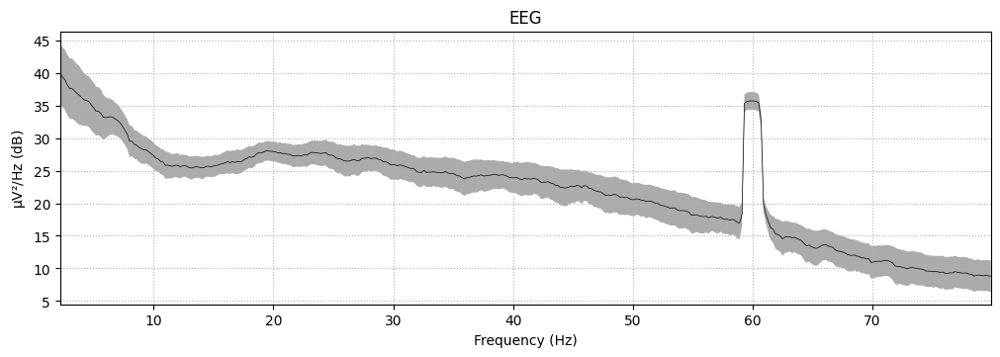

In [ ]:
# Define the subject and session you want to analyze
subject_id = 6
session_id = 3

# Load the EEG data using MNE
raw = mne.io.read_raw_edf(f'{data_path}S{subject_id:03d}/S{subject_id:03d}R{session_id:02d}.edf', preload=True)

# Extract events based on triggers
events, _ = mne.events_from_annotations(raw)

# Print available event IDs for debugging
print("Available event IDs:", np.unique(events[:, -1]))

# Specify the correct event ID based on your data
event_id = dict(left_hand=1)  # Make sure this corresponds to an actual event in your data

# Create epochs
epochs = mne.Epochs(raw, events=events, event_id=event_id, tmin=-1, tmax=4, baseline=(None, 0), preload=True)

# Check if any epochs were found
if len(epochs) == 0:
    print("No epochs found for the specified event ID. Check your event ID or adjust event extraction.")

else:
    # Get the EEG data for a specific trial
    trial_number = 0
    eeg_data = epochs.get_data()[trial_number]

    # Calculate the signal power and noise power
    signal_power = np.mean(np.var(eeg_data, axis=1))
    noise_power = np.mean(np.mean(np.var(epochs.get_data(), axis=2), axis=0))

    # Calculate the SNR (Signal-to-Noise Ratio)
    snr = 10 * np.log10(signal_power / noise_power)

    # Print the SNR value
    print(f"SNR for trial {trial_number + 1}: {snr:.2f} dB")

    # Plot the EEG data for the selected trial
    epochs.plot_psd(fmin=2, fmax=80, average=True, spatial_colors=False)
    plt.show()

Uma outra forma de calcular a taxa, ou relação, sinal-ruídio, pode ser implementada com codigos mais explicitos à manipulação de tipos de dados, o tamanho e as dimensções dos vetores e matrizes. Além disso, a tulizaão da funcão welch(), que corresponde ao cálcuo pWelch para obtenção da densidade espectral de potência (PSD), para análise e manipulação do sinal no espectro da frequência.


/usr/local/lib/python3.10/dist-packages/scipy/signal/_spectral_py.py:2017: UserWarning: nperseg = 1024 is greater than input length  = 800, using nperseg = 800
  warnings.warn('nperseg = {0:d} is greater than input length '


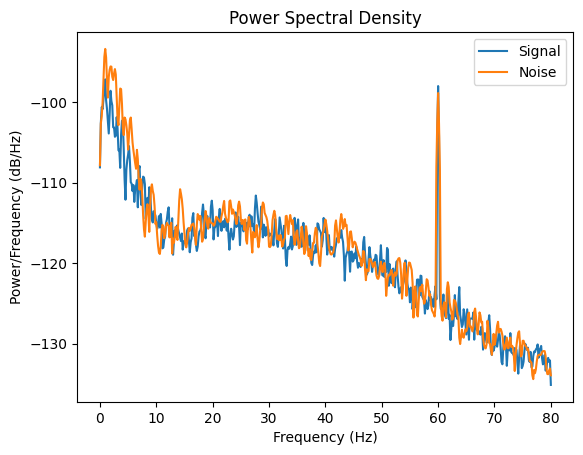

In [ ]:
from scipy.interpolate import interp1d

# Define signal and noise regions (adjust these based on your experiment)
signal_start, signal_end = 10, 20  # Example: 10 to 20 seconds as signal region
noise_start, noise_end = 0, 5      # Example: 0 to 5 seconds as noise region

# Extract data for signal and noise regions
signal_data, _ = raw[:, int(signal_start * raw.info['sfreq']):int(signal_end * raw.info['sfreq'])]
noise_data, _ = raw[:, int(noise_start * raw.info['sfreq']):int(noise_end * raw.info['sfreq'])]

# Calculate power spectral density using Welch's method
f_signal, Pxx_signal = welch(signal_data, fs=raw.info['sfreq'], nperseg=1024)
f_noise, Pxx_noise = welch(noise_data, fs=raw.info['sfreq'], nperseg=1024)

# Interpolate power arrays to a common frequency grid
f_common = np.linspace(min(f_signal[0], f_noise[0]), max(f_signal[-1], f_noise[-1]), len(f_signal))
interp_signal = interp1d(f_signal, Pxx_signal, kind='linear', fill_value='extrapolate')(f_common)
interp_noise = interp1d(f_noise, Pxx_noise, kind='linear', fill_value='extrapolate')(f_common)

# Calculate average power in signal and noise frequency bands
signal_power = np.mean(interp_signal, axis=0)
noise_power = np.mean(interp_noise, axis=0)

# Calculate SNR in decibels
snr_db = 10 * np.log10(signal_power / noise_power)

# print(f'SNR for Subject {subject_id}, Session {session_id}: {snr_db:.2f} dB')

# Plot power spectral density for visual inspection (optional)
plt.figure()
plt.plot(f_common, 10 * np.log10(signal_power), label='Signal')
plt.plot(f_common, 10 * np.log10(noise_power), label='Noise')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power/Frequency (dB/Hz)')
plt.legend()
plt.title('Power Spectral Density')
plt.show()


Logo abaixo, seguem mais exemplos de implementações na liguagem de programação Python, para elucidar algumas caracteristicas do sinal, além de demonstrar os cálculos matemáticos para transformar o sinal no espectro da frequência, como por exemplo a funcção compute_PSD(), do inglês Power Spectral Density.  

Effective window size : 12.800 (s)
Using matplotlib as 2D backend.


<ipython-input-8-705a124d01af>:1: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  raw.compute_psd(fmax=50).plot(picks="data", exclude="bads", amplitude=False)


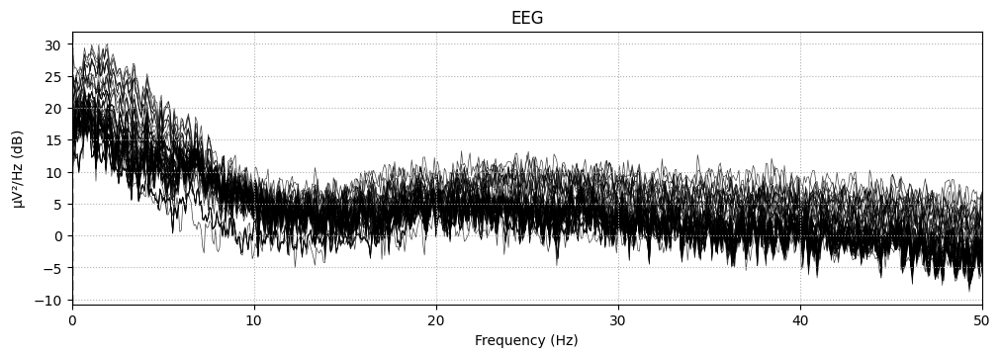

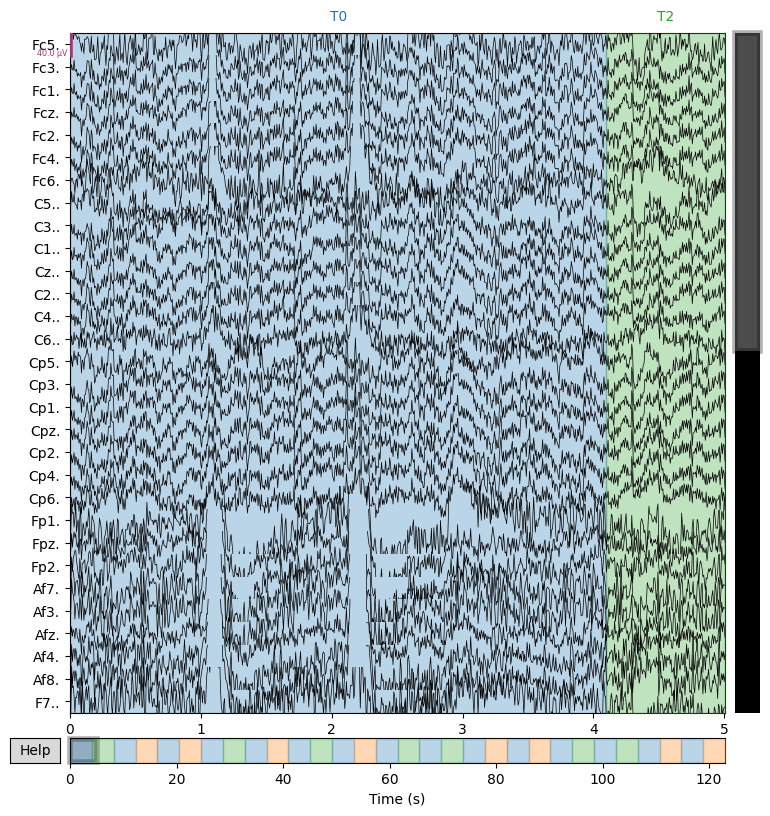

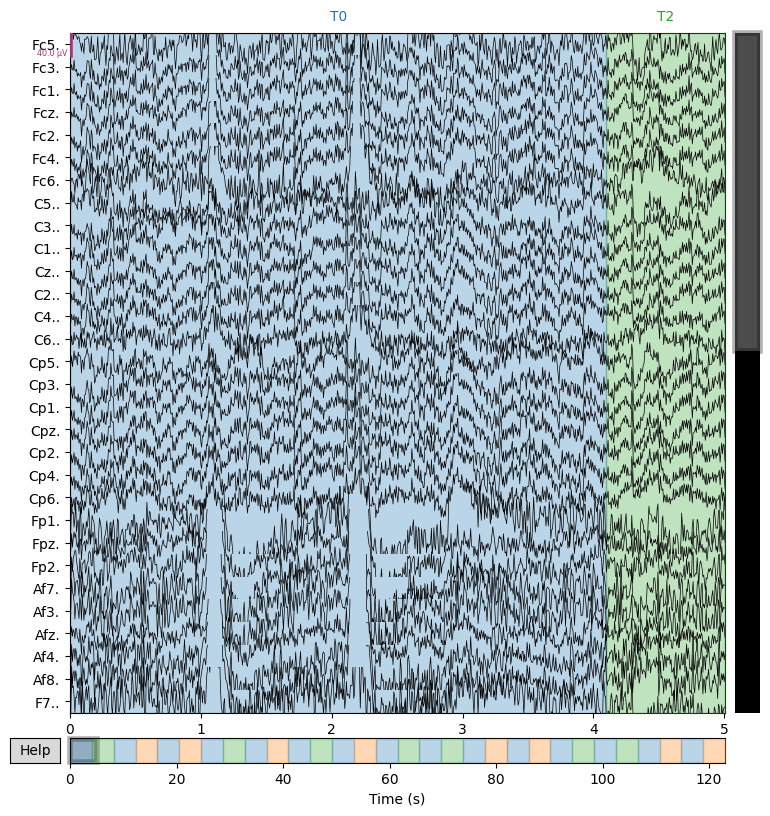

In [ ]:
raw.compute_psd(fmax=50).plot(picks="data", exclude="bads", amplitude=False)
raw.plot(duration=5, n_channels=30)

Para alcançar os resultados finais, do calculos das SNRs dos sinais EEG, presente nos dados do individuos e nas respectivas rodadas do experimento, passou-se pela etapas de correção e aprimoramento de algoritimos. De acordo com as mensagens de erros, e com os algorítimos abaixo.

In [ ]:
# Define the subject and session you want to analyze
subject_id = 1
session_id = 1

# Load the EEG data using MNE
raw = mne.io.read_raw_edf(f'{data_path}S{subject_id:03d}/S{subject_id:03d}R{session_id:02d}.edf', preload=True)

# Extract EEG epochs for a specific event (e.g., left hand movement)
event_id = dict(left_hand=1)
epochs = mne.Epochs(raw, events=None, event_id=event_id, tmin=-1, tmax=4, baseline=(None, 0), preload=True)

# Get the EEG data for a specific trial
trial_number = 0
eeg_data = epochs.get_data()[trial_number]

# Calculate the signal power and noise power
signal_power = np.mean(np.var(eeg_data, axis=1))
noise_power = np.mean(np.mean(np.var(epochs.get_data(), axis=2), axis=0))

# Calculate the SNR (Signal-to-Noise Ratio)
snr = 10 * np.log10(signal_power / noise_power)

# Print the SNR value
print(f"SNR for trial {trial_number + 1}: {snr:.2f} dB")

# Plot the EEG data for the selected trial
epochs.plot_psd(fmin=2, fmax=40, average=True, spatial_colors=False)
plt.show()


Extracting EDF parameters from /content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/S001/S001R01.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 9759  =      0.000 ...    60.994 secs...
Not setting metadata
Setting baseline interval to [-1.0, 0.0] s
Applying baseline correction (mode: mean)
0 projection items activated


AttributeError: 'Epochs' object has no attribute 'events'

In [ ]:
# Extract events based on triggers
events, _ = mne.events_from_annotations(raw)

# Define event IDs (assuming 'left hand' movement triggers have ID 1)
event_id = dict(left_hand=1)

# Create epochs
epochs = mne.Epochs(raw, events=events, event_id=event_id, tmin=-1, tmax=4, baseline=(None, 0), preload=True)

# Get the EEG data for a specific trial
trial_number = 0
eeg_data = epochs.get_data()[trial_number]

# Calculate the signal power and noise power
signal_power = np.mean(np.var(eeg_data, axis=1))
noise_power = np.mean(np.mean(np.var(epochs.get_data(), axis=2), axis=0))

# Calculate the SNR (Signal-to-Noise Ratio)
snr = 10 * np.log10(signal_power / noise_power)

# Print the SNR value
print(f"SNR for trial {trial_number + 1}: {snr:.2f} dB")

# Plot the EEG data for the selected trial
epochs.plot_psd(fmin=2, fmax=40, average=True, spatial_colors=False)
plt.show()

Used Annotations descriptions: ['T0']
Not setting metadata
1 matching events found
Setting baseline interval to [-1.0, 0.0] s
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 1 events and 801 original time points ...
1 bad epochs dropped


<ipython-input-10-2615fa16773f>:8: RuntimeWarning: All epochs were dropped!
You might need to alter reject/flat-criteria or drop bad channels to avoid this. You can use Epochs.plot_drop_log() to see which channels are responsible for the dropping of epochs.
  epochs = mne.Epochs(raw, events=events, event_id=event_id, tmin=-1, tmax=4, baseline=(None, 0), preload=True)
<ipython-input-10-2615fa16773f>:12: RuntimeWarning: epochs._get_data() can't run because this Epochs-object is empty. You might want to check Epochs.drop_log or Epochs.plot_drop_log() to see why epochs were dropped.
  eeg_data = epochs.get_data()[trial_number]
<ipython-input-10-2615fa16773f>:12: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  eeg_data = epochs.get_data()[trial_number]


IndexError: index 0 is out of bounds for axis 0 with size 0

In [ ]:
# Define the subject and session you want to analyze
subject_id = 1
session_id = 1

# Load the EEG data using MNE
raw = mne.io.read_raw_edf(f'{data_path}S{subject_id:03d}/S{subject_id:03d}R{session_id:02d}.edf', preload=True)

# Specify the events and event_id based on the task you're interested in
# For example, for left-hand movement: event_id = {'left': 2}
events, event_id = mne.events_from_annotations(raw)


# Example: Automatic bad channel detection
# raw.info['bads'] = mne.pick_channels_regexp(raw.ch_names, regexp='(EOG 061|EOG 062|ECG 063)')

# Apply automatic rejection criteria
reject_criteria = dict(eeg=300e-6)  # Adjust as needed
epochs = mne.Epochs(raw, events, event_id, tmin=-1, tmax=4, baseline=None, reject=reject_criteria, preload=True)
# epochs.drop_bad(reject=reject_criteria)

# Example: Calculate variance of the noisy segments
noisy_segments = epochs.get_data()
noise_power = np.var(noisy_segments)
print('Noise Power: ', noise_power)



Extracting EDF parameters from /content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/S001/S001R01.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 9759  =      0.000 ...    60.994 secs...
Used Annotations descriptions: ['T0']
Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1 events and 801 original time points ...
1 bad epochs dropped
Noise Power:  nan


<ipython-input-11-35ad7ba6abf9>:18: RuntimeWarning: All epochs were dropped!
You might need to alter reject/flat-criteria or drop bad channels to avoid this. You can use Epochs.plot_drop_log() to see which channels are responsible for the dropping of epochs.
  epochs = mne.Epochs(raw, events, event_id, tmin=-1, tmax=4, baseline=None, reject=reject_criteria, preload=True)
<ipython-input-11-35ad7ba6abf9>:22: RuntimeWarning: epochs._get_data() can't run because this Epochs-object is empty. You might want to check Epochs.drop_log or Epochs.plot_drop_log() to see why epochs were dropped.
  noisy_segments = epochs.get_data()
<ipython-input-11-35ad7ba6abf9>:22: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  noisy_segments = epochs.get_data()
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3715: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtyp

In [ ]:
# Define the subject and session you want to analyze
subject_id = 1
session_id = 1

# Load the EEG data using MNE
raw = mne.io.read_raw_edf(f'{data_path}S{subject_id:03d}/S{subject_id:03d}R{session_id:02d}.edf', preload=True)

# Define signal and noise regions (adjust these based on your experiment)
signal_start, signal_end = 10, 20  # Example: 10 to 20 seconds as signal region
noise_start, noise_end = 0, 5      # Example: 0 to 5 seconds as noise region

# Extract data for signal and noise regions
signal_data, _ = raw[:, int(signal_start * raw.info['sfreq']):int(signal_end * raw.info['sfreq'])]
noise_data, _ = raw[:, int(noise_start * raw.info['sfreq']):int(noise_end * raw.info['sfreq'])]

# Calculate power spectral density using Welch's method
f_signal, Pxx_signal = welch(signal_data.get_data(), fs=raw.info['sfreq'], nperseg=1024)
f_noise, Pxx_noise = welch(noise_data.get_data(), fs=raw.info['sfreq'], nperseg=1024)

# Calculate average power in signal and noise frequency bands
signal_power = np.mean(Pxx_signal)
noise_power = np.mean(Pxx_noise)

# Calculate SNR in decibels
snr_db = 10 * np.log10(signal_power / noise_power)


print(f'SNR for Subject {subject_id}, Session {session_id}: {snr_db:.2f} dB')

# Plot power spectral density for visual inspection (optional)
plt.figure()
plt.plot(f_signal, 10 * np.log10(Pxx_signal), label='Signal')
plt.plot(f_noise, 10 * np.log10(Pxx_noise), label='Noise')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power/Frequency (dB/Hz)')
plt.legend()
plt.title('Power Spectral Density')
plt.show()

Extracting EDF parameters from /content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/S001/S001R01.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 9759  =      0.000 ...    60.994 secs...


AttributeError: 'numpy.ndarray' object has no attribute 'get_data'

In [ ]:
# Define the subject and session you want to analyze
subject_id = 1
session_id = 1

# Load the EEG data using MNE
raw = mne.io.read_raw_edf(f'{data_path}S{subject_id:03d}/S{subject_id:03d}R{session_id:02d}.edf', preload=True)

# Define signal and noise regions (adjust these based on your experiment)
signal_start, signal_end = 10, 20  # Example: 10 to 20 seconds as signal region
noise_start, noise_end = 0, 5      # Example: 0 to 5 seconds as noise region

# Extract data for signal and noise regions
signal_data, _ = raw[:, int(signal_start * raw.info['sfreq']):int(signal_end * raw.info['sfreq'])]
noise_data, _ = raw[:, int(noise_start * raw.info['sfreq']):int(noise_end * raw.info['sfreq'])]

# Calculate power spectral density using Welch's method
f_signal, Pxx_signal = welch(signal_data, fs=raw.info['sfreq'], nperseg=1024)
f_noise, Pxx_noise = welch(noise_data, fs=raw.info['sfreq'], nperseg=1024)

# Calculate average power in signal and noise frequency bands
signal_power = np.mean(Pxx_signal, axis=0)
noise_power = np.mean(Pxx_noise, axis=0)

# Calculate SNR in decibels
snr_db = 10 * np.log10(signal_power / noise_power)

print(f'SNR for Subject {subject_id}, Session {session_id}: {snr_db:.2f} dB')

# Plot power spectral density for visual inspection (optional)
plt.figure()
plt.plot(f_signal, 10 * np.log10(Pxx_signal), label='Signal')
plt.plot(f_noise, 10 * np.log10(Pxx_noise), label='Noise')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power/Frequency (dB/Hz)')
plt.legend()
plt.title('Power Spectral Density')
plt.show()

Extracting EDF parameters from /content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/S001/S001R01.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 9759  =      0.000 ...    60.994 secs...


/usr/local/lib/python3.10/dist-packages/scipy/signal/_spectral_py.py:2017: UserWarning: nperseg = 1024 is greater than input length  = 800, using nperseg = 800
  warnings.warn('nperseg = {0:d} is greater than input length '


ValueError: operands could not be broadcast together with shapes (513,) (401,) 

In [ ]:

# Define the subject and session you want to analyze
subject_id = 1
session_id = 1

# Load the EEG data using MNE
raw = mne.io.read_raw_edf(f'{data_path}S{subject_id:03d}/S{subject_id:03d}R{session_id:02d}.edf', preload=True)

# Define signal and noise regions (adjust these based on your experiment)
signal_start, signal_end = 10, 20  # Example: 10 to 20 seconds as signal region
noise_start, noise_end = 0, 5      # Example: 0 to 5 seconds as noise region

# Extract data for signal and noise regions
signal_data, _ = raw[:, int(signal_start * raw.info['sfreq']):int(signal_end * raw.info['sfreq'])]
noise_data, _ = raw[:, int(noise_start * raw.info['sfreq']):int(noise_end * raw.info['sfreq'])]

# Calculate power spectral density using Welch's method
f_signal, Pxx_signal = welch(signal_data, fs=raw.info['sfreq'], nperseg=1024)
f_noise, Pxx_noise = welch(noise_data, fs=raw.info['sfreq'], nperseg=1024)

# Interpolate or resample frequency vectors to match lengths
f_signal_resampled = np.linspace(f_signal[0], f_signal[-1], len(f_noise))
Pxx_signal_resampled = np.interp(f_signal_resampled, f_signal, Pxx_signal)

# Calculate average power in signal and noise frequency bands
signal_power = np.mean(Pxx_signal_resampled, axis=0)
noise_power = np.mean(Pxx_noise, axis=0)

# Calculate SNR in decibels
snr_db = 10 * np.log10(signal_power / noise_power)

print(f'SNR for Subject {subject_id}, Session {session_id}: {snr_db:.2f} dB')

# Plot power spectral density for visual inspection (optional)
plt.figure()
plt.plot(f_signal_resampled, 10 * np.log10(Pxx_signal_resampled), label='Signal')
plt.plot(f_noise, 10 * np.log10(Pxx_noise), label='Noise')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power/Frequency (dB/Hz)')
plt.legend()
plt.title('Power Spectral Density')
plt.show()


Extracting EDF parameters from /content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/S001/S001R01.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 9759  =      0.000 ...    60.994 secs...


ValueError: object too deep for desired array

In [ ]:
# Define the subject and session you want to analyze
subject_id = 1
session_id = 1

# Load the EEG data using MNE
raw = mne.io.read_raw_edf(f'{data_path}S{subject_id:03d}/S{subject_id:03d}R{session_id:02d}.edf', preload=True)

# Define signal and noise regions (adjust these based on your experiment)
signal_start, signal_end = 10, 20  # Example: 10 to 20 seconds as signal region
noise_start, noise_end = 0, 5      # Example: 0 to 5 seconds as noise region

# Extract data for signal and noise regions
signal_data, _ = raw[:, int(signal_start * raw.info['sfreq']):int(signal_end * raw.info['sfreq'])]
noise_data, _ = raw[:, int(noise_start * raw.info['sfreq']):int(noise_end * raw.info['sfreq'])]

# Calculate power spectral density using Welch's method
f_signal, Pxx_signal = welch(signal_data, fs=raw.info['sfreq'], nperseg=1024)
f_noise, Pxx_noise = welch(noise_data, fs=raw.info['sfreq'], nperseg=1024)

# Ensure frequency vectors are aligned
f_signal, Pxx_signal = f_signal[:len(f_noise)], Pxx_signal[:len(f_noise)]

# Calculate average power in signal and noise frequency bands
signal_power = np.mean(Pxx_signal, axis=0)
noise_power = np.mean(Pxx_noise, axis=0)

# Calculate SNR in decibels
snr_db = 10 * np.log10(signal_power / noise_power)

print(f'SNR for Subject {subject_id}, Session {session_id}: {snr_db:.2f} dB')

# Plot power spectral density for visual inspection (optional)
plt.figure()
plt.plot(f_signal, 10 * np.log10(Pxx_signal), label='Signal')
plt.plot(f_noise, 10 * np.log10(Pxx_noise), label='Noise')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power/Frequency (dB/Hz)')
plt.legend()
plt.title('Power Spectral Density')
plt.show()

Extracting EDF parameters from /content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/S001/S001R01.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 9759  =      0.000 ...    60.994 secs...


ValueError: operands could not be broadcast together with shapes (513,) (401,) 

In [ ]:
# Define the subject and session you want to analyze
subject_id = 1
session_id = 1

# Load the EEG data using MNE
raw = mne.io.read_raw_edf(f'{data_path}S{subject_id:03d}/S{subject_id:03d}R{session_id:02d}.edf', preload=True)

# Define signal and noise regions (adjust these based on your experiment)
signal_start, signal_end = 10, 20  # Example: 10 to 20 seconds as signal region
noise_start, noise_end = 0, 5      # Example: 0 to 5 seconds as noise region

# Extract data for signal and noise regions
signal_data, _ = raw[:, int(signal_start * raw.info['sfreq']):int(signal_end * raw.info['sfreq'])]
noise_data, _ = raw[:, int(noise_start * raw.info['sfreq']):int(noise_end * raw.info['sfreq'])]

# Calculate power spectral density using Welch's method
f_signal, Pxx_signal = welch(signal_data, fs=raw.info['sfreq'], nperseg=1024)
f_noise, Pxx_noise = welch(noise_data, fs=raw.info['sfreq'], nperseg=1024)

# Ensure frequency vectors are aligned
min_len = min(len(f_signal), len(f_noise))
f_signal, Pxx_signal = f_signal[:min_len], Pxx_signal[:min_len]
f_noise, Pxx_noise = f_noise[:min_len], Pxx_noise[:min_len]

# Calculate average power in signal and noise frequency bands
signal_power = np.mean(Pxx_signal, axis=0)
noise_power = np.mean(Pxx_noise, axis=0)

# Calculate SNR in decibels
snr_db = 10 * np.log10(signal_power / noise_power)

print(f'SNR for Subject {subject_id}, Session {session_id}: {snr_db:.2f} dB')

# Plot power spectral density for visual inspection (optional)
plt.figure()
plt.plot(f_signal, 10 * np.log10(Pxx_signal), label='Signal')
plt.plot(f_noise, 10 * np.log10(Pxx_noise), label='Noise')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power/Frequency (dB/Hz)')
plt.legend()
plt.title('Power Spectral Density')
plt.show()

Extracting EDF parameters from /content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/S001/S001R01.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 9759  =      0.000 ...    60.994 secs...


ValueError: operands could not be broadcast together with shapes (513,) (401,) 

**Qual a amplitude do dado?**


A amplitude de um sinal pode ser calculada utilizando vários métodos dependendo das características do seu sinal e das informações que deseja extrair. A amplitude de um sinal geralmente refere-se ao valor máximo absoluto do sinal. No contexto de sinais EEG, é possível obter a amplitude de componentes de frequência específicos, ou na amplitude geral.

Segue abaixo, um exemplo simples utilizando o mesmo conjunto de dados BCI2000 EEGMMIDB, na linguegem de programação Python, com a biblioteca MNE, para calcular a amplitude de banda de frequências específicas: banda alfa/Mu e Beta.

Para calcular a amplitude geral de um sinal de EEG, você pode encontrar o valor absoluto máximo em todos os pontos de tempo e canais nos dados de EEG.



Extracting EDF parameters from /content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/S001/S001R03.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...
Used Annotations descriptions: ['T0', 'T1', 'T2']
Not setting metadata
15 matching events found
Setting baseline interval to [-1.0, 0.0] s
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 15 events and 801 original time points ...
1 bad epochs dropped
Overall Amplitude for trial 1: 0.0005 uV
Mu Amplitude for trial 1: 0.0001 uV
Beta Amplitude for trial 1: 0.0001 uV
NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().


<ipython-input-10-3cc981ebc8ed>:20: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  eeg_data = epochs.get_data()[trial_number]


    Using multitaper spectrum estimation with 7 DPSS windows
Averaging across epochs...


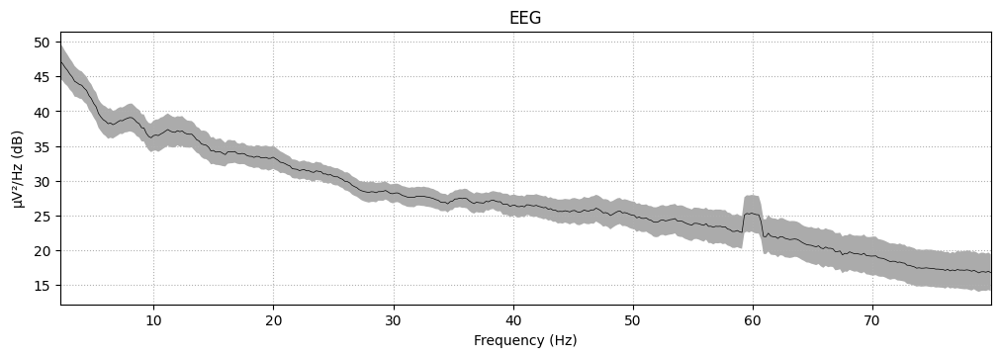

In [ ]:
# Define the subject and session you want to analyze
subject_id = 1
session_id = 3

# Load the EEG data using MNE
raw = mne.io.read_raw_edf(f'{data_path}S{subject_id:03d}/S{subject_id:03d}R{session_id:02d}.edf', preload=True)


# Extract events based on triggers
events, _ = mne.events_from_annotations(raw)

# Specify the event ID based on your data
event_id = dict(left_hand=1)

# Create epochs
epochs = mne.Epochs(raw, events=events, event_id=event_id, tmin=-1, tmax=4, baseline=(None, 0), preload=True)

# Get the EEG data for a specific trial
trial_number = 0
eeg_data = epochs.get_data()[trial_number]


# Calculate the overall amplitude
overall_amplitude = np.max(np.abs(eeg_data))
# Print the overall amplitude value
print(f"Overall Amplitude for trial {trial_number + 1}: {overall_amplitude:.4f} uV")


# Specify the frequency bands of interest (Mu: 8-13 Hz, Beta: 13-30 Hz)
mu_band = (8, 13)
beta_band = (13, 30)

# Calculate the amplitude for Mu and Beta frequency bands
mu_amplitude = np.max(np.abs(mne.filter.filter_data(eeg_data, raw.info['sfreq'], mu_band[0], mu_band[1], verbose=False)))
beta_amplitude = np.max(np.abs(mne.filter.filter_data(eeg_data, raw.info['sfreq'], beta_band[0], beta_band[1], verbose=False)))

# Print the amplitude values
print(f"Mu Amplitude for trial {trial_number + 1}: {mu_amplitude:.4f} uV")
print(f"Beta Amplitude for trial {trial_number + 1}: {beta_amplitude:.4f} uV")

# Plot the EEG data for the selected trial
epochs.plot_psd(fmin=2, fmax=80, average=True, spatial_colors=False)
plt.show()

**Existe padrão para abrir e fechar a mão E/D no canal N?**

Para confirmar a existência do padrão foi necessário realizar a pesquisa de dados para cada individuo, num respectivo canal, num determinado intervalo de tempo, e numa a determinada frequencia.

A busca pelo padrão do movimento de abrir e fechar as mãos esquerda e direita assíncronamente, em sinais EEG nas frequências Mu e Beta envolveu algumas etapas.

As técnicas de processamento de sinal, como filtragem, extração de épocas e correspondência de modelos, foram aplicadas no exemplo de algorítimo, na liguagem de programação Python, que demonstra como executar essas etapas usando a biblioteca MNE para um conjunto específico de rodadas (3, 4, 7, 8, 11, 12) de todos os indivíduos cujos sinais foram coletados.

Inicialmente o algoritmo carrega os dados correspondentes ao sinais EEG para cada individuo de determinada rodada, ou execução do experimento. Em seguida, filtra-os nas bandas de frequência Mu e Beta e,  os sinais correspondentes às médias  os movimentos da mão esquerda e direita.

O parâmetro fir_design especifica o método usado para projetar o filtro Finite Impulse Response (FIR). 'firwin' é um método no MNE que projeta um filtro FIR usando o método de janela.


## revisar o grafico com intervalo de tempo negativo -1

Extracting EDF parameters from /content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/S001/S001R03.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...
Used Annotations descriptions: ['T0', 'T1', 'T2']
Not setting metadata
23 matching events found
Setting baseline interval to [-1.0, 0.0] s
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 23 events and 801 original time points ...
1 bad epochs dropped
Setting up band-pass filter from 8 - 13 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 8.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 7.00 Hz)
- Upper passband edge: 13.00 Hz
- Upper transition bandwidth: 3.25 Hz (-6 dB cut

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 287 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.4s
[Parallel(n_jobs=1)]: Done 647 tasks      | elapsed:    0.5s
[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:    0.7s


Setting up band-pass filter from 13 - 30 Hz

FIR filter parameters
---------------------


[Parallel(n_jobs=1)]: Done 1151 tasks      | elapsed:    0.9s


Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 13.00
- Lower transition bandwidth: 3.25 Hz (-6 dB cutoff frequency: 11.38 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 163 samples (1.019 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 287 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.5s
[Parallel(n_jobs=1)]: Done 647 tasks      | elapsed:    0.7s
[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:    0.9s
[Parallel(n_jobs=1)]: Done 1151 tasks      | elapsed:    1.2s
<ipython-input-35-3cce36d29a59>:32: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  left_hand_data = epochs['left_hand'].get_data()
<ipython-input-35-3cce36d29a59>:33: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  right_hand_data = epochs['right_hand'].get_data()


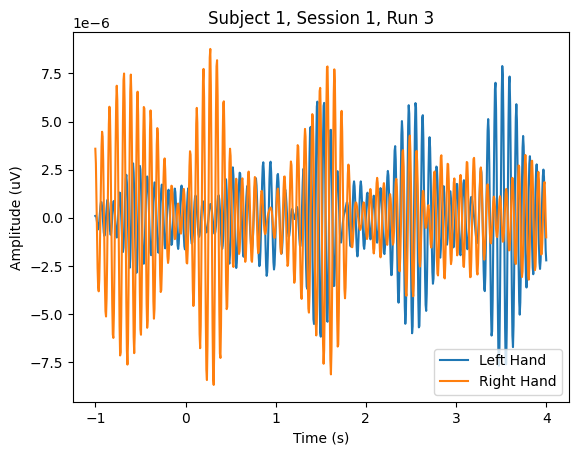

Extracting EDF parameters from /content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/S001/S001R03.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...
Used Annotations descriptions: ['T0', 'T1', 'T2']
Not setting metadata
23 matching events found
Setting baseline interval to [-1.0, 0.0] s
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 23 events and 801 original time points ...
1 bad epochs dropped
Setting up band-pass filter from 8 - 13 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 8.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 7.00 Hz)
- Upper passband edge: 13.00 Hz
- Upper transition bandwidth: 3.25 Hz (-6 dB cut

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 287 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.4s
[Parallel(n_jobs=1)]: Done 647 tasks      | elapsed:    0.6s
[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:    0.7s
[Parallel(n_jobs=1)]: Done 1151 tasks      | elapsed:    0.9s


Setting up band-pass filter from 13 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 13.00
- Lower transition bandwidth: 3.25 Hz (-6 dB cutoff frequency: 11.38 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 163 samples (1.019 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 287 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.5s
[Parallel(n_jobs=1)]: Done 647 tasks      | elapsed:    0.7s
[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:    0.9s
[Parallel(n_jobs=1)]: Done 1151 tasks      | elapsed:    1.1s
<ipython-input-35-3cce36d29a59>:32: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  left_hand_data = epochs['left_hand'].get_data()
<ipython-input-35-3cce36d29a59>:33: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  right_hand_data = epochs['right_hand'].get_data()


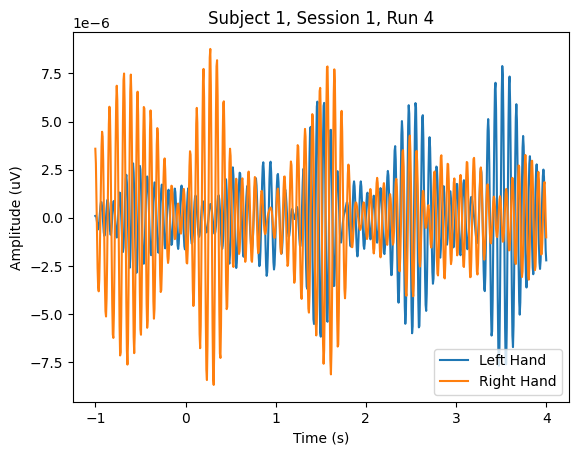

Extracting EDF parameters from /content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/S001/S001R03.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...
Used Annotations descriptions: ['T0', 'T1', 'T2']
Not setting metadata
23 matching events found
Setting baseline interval to [-1.0, 0.0] s
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 23 events and 801 original time points ...
1 bad epochs dropped
Setting up band-pass filter from 8 - 13 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 8.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 7.00 Hz)
- Upper passband edge: 13.00 Hz
- Upper transition bandwidth: 3.25 Hz (-6 dB cut

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 287 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done 647 tasks      | elapsed:    0.4s
[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:    0.5s
[Parallel(n_jobs=1)]: Done 1151 tasks      | elapsed:    0.6s


Setting up band-pass filter from 13 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 13.00
- Lower transition bandwidth: 3.25 Hz (-6 dB cutoff frequency: 11.38 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 163 samples (1.019 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 287 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done 647 tasks      | elapsed:    0.5s
[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:    0.6s
[Parallel(n_jobs=1)]: Done 1151 tasks      | elapsed:    0.8s
<ipython-input-35-3cce36d29a59>:32: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  left_hand_data = epochs['left_hand'].get_data()
<ipython-input-35-3cce36d29a59>:33: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  right_hand_data = epochs['right_hand'].get_data()


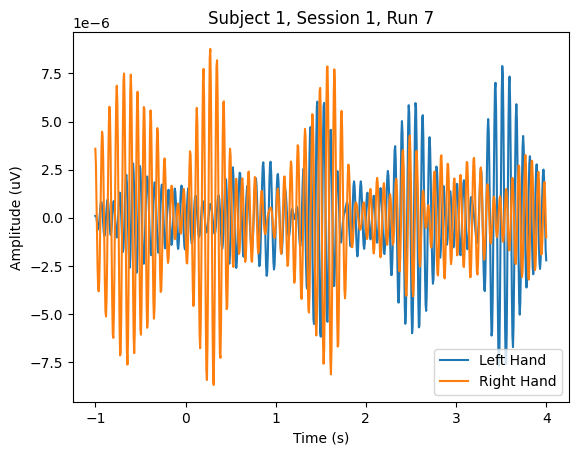

Extracting EDF parameters from /content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/S001/S001R03.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...
Used Annotations descriptions: ['T0', 'T1', 'T2']
Not setting metadata
23 matching events found
Setting baseline interval to [-1.0, 0.0] s
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 23 events and 801 original time points ...
1 bad epochs dropped
Setting up band-pass filter from 8 - 13 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 8.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 7.00 Hz)
- Upper passband edge: 13.00 Hz
- Upper transition bandwidth: 3.25 Hz (-6 dB cut

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 287 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done 647 tasks      | elapsed:    0.4s
[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:    0.5s
[Parallel(n_jobs=1)]: Done 1151 tasks      | elapsed:    0.6s


Setting up band-pass filter from 13 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 13.00
- Lower transition bandwidth: 3.25 Hz (-6 dB cutoff frequency: 11.38 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 163 samples (1.019 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 287 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.4s
[Parallel(n_jobs=1)]: Done 647 tasks      | elapsed:    0.5s
[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:    0.7s
[Parallel(n_jobs=1)]: Done 1151 tasks      | elapsed:    0.8s
<ipython-input-35-3cce36d29a59>:32: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  left_hand_data = epochs['left_hand'].get_data()
<ipython-input-35-3cce36d29a59>:33: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  right_hand_data = epochs['right_hand'].get_data()


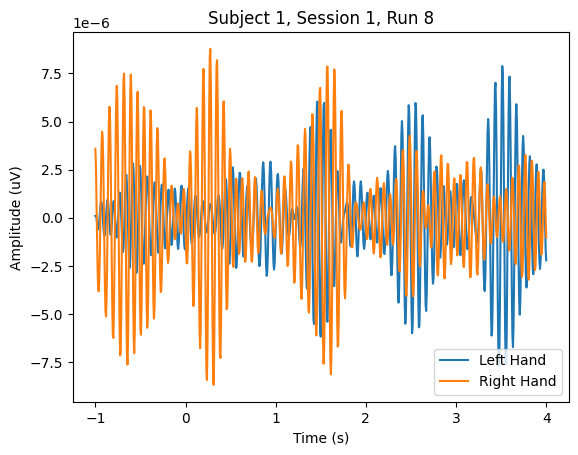

Extracting EDF parameters from /content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/S001/S001R03.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...
Used Annotations descriptions: ['T0', 'T1', 'T2']
Not setting metadata
23 matching events found
Setting baseline interval to [-1.0, 0.0] s
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 23 events and 801 original time points ...
1 bad epochs dropped
Setting up band-pass filter from 8 - 13 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 8.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 7.00 Hz)
- Upper passband edge: 13.00 Hz
- Upper transition bandwidth: 3.25 Hz (-6 dB cut

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 287 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done 647 tasks      | elapsed:    0.4s
[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:    0.5s
[Parallel(n_jobs=1)]: Done 1151 tasks      | elapsed:    0.7s


Setting up band-pass filter from 13 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 13.00
- Lower transition bandwidth: 3.25 Hz (-6 dB cutoff frequency: 11.38 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 163 samples (1.019 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 287 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done 647 tasks      | elapsed:    0.4s
[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:    0.6s
[Parallel(n_jobs=1)]: Done 1151 tasks      | elapsed:    0.8s
<ipython-input-35-3cce36d29a59>:32: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  left_hand_data = epochs['left_hand'].get_data()
<ipython-input-35-3cce36d29a59>:33: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  right_hand_data = epochs['right_hand'].get_data()


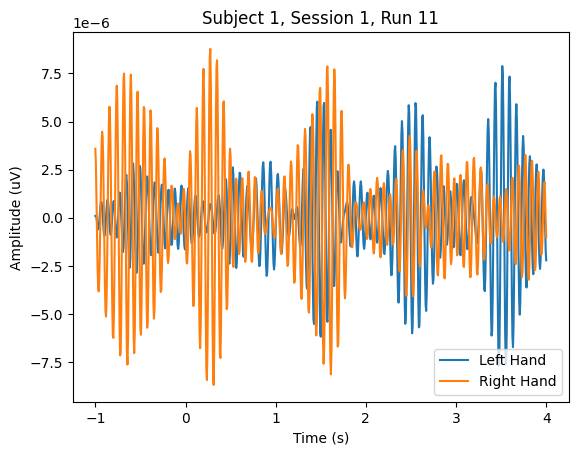

Extracting EDF parameters from /content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/S001/S001R03.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...
Used Annotations descriptions: ['T0', 'T1', 'T2']
Not setting metadata
23 matching events found
Setting baseline interval to [-1.0, 0.0] s
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 23 events and 801 original time points ...
1 bad epochs dropped
Setting up band-pass filter from 8 - 13 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 8.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 7.00 Hz)
- Upper passband edge: 13.00 Hz
- Upper transition bandwidth: 3.25 Hz (-6 dB cut

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 287 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.4s
[Parallel(n_jobs=1)]: Done 647 tasks      | elapsed:    0.5s
[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:    0.6s


Setting up band-pass filter from 13 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 13.00
- Lower transition bandwidth: 3.25 Hz (-6 dB cutoff frequency: 11.38 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 163 samples (1.019 s)



[Parallel(n_jobs=1)]: Done 1151 tasks      | elapsed:    0.7s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 287 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.4s
[Parallel(n_jobs=1)]: Done 647 tasks      | elapsed:    0.5s
[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:    0.7s
[Parallel(n_jobs=1)]: Done 1151 tasks      | elapsed:    0.9s
<ipython-input-35-3cce36d29a59>:32: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  left_hand_data = epochs['left_hand'].get_data()
<ipython-input-35-3cce36d29a59>:33: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  right_hand_data = epochs['right_hand'].get_data()


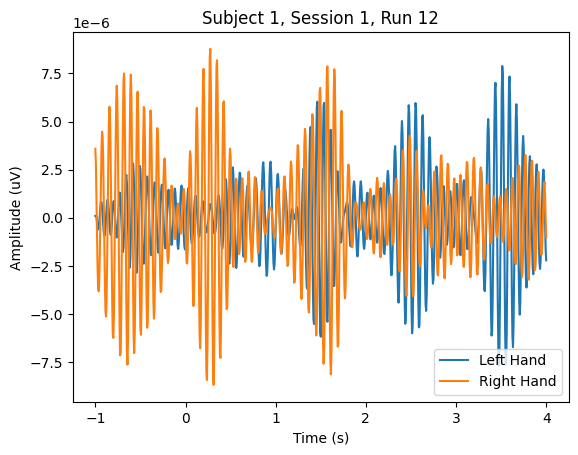

Extracting EDF parameters from /content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/S001/S001R03.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...
Used Annotations descriptions: ['T0', 'T1', 'T2']
Not setting metadata
23 matching events found
Setting baseline interval to [-1.0, 0.0] s
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 23 events and 801 original time points ...
1 bad epochs dropped
Setting up band-pass filter from 8 - 13 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 8.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 7.00 Hz)
- Upper passband edge: 13.00 Hz
- Upper transition bandwidth: 3.25 Hz (-6 dB cut

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 287 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.4s
[Parallel(n_jobs=1)]: Done 647 tasks      | elapsed:    0.6s
[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:    0.9s
[Parallel(n_jobs=1)]: Done 1151 tasks      | elapsed:    1.1s


Setting up band-pass filter from 13 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 13.00
- Lower transition bandwidth: 3.25 Hz (-6 dB cutoff frequency: 11.38 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 163 samples (1.019 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 287 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.5s
[Parallel(n_jobs=1)]: Done 647 tasks      | elapsed:    0.7s
[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:    0.9s
[Parallel(n_jobs=1)]: Done 1151 tasks      | elapsed:    1.1s
<ipython-input-35-3cce36d29a59>:32: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  left_hand_data = epochs['left_hand'].get_data()
<ipython-input-35-3cce36d29a59>:33: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  right_hand_data = epochs['right_hand'].get_data()


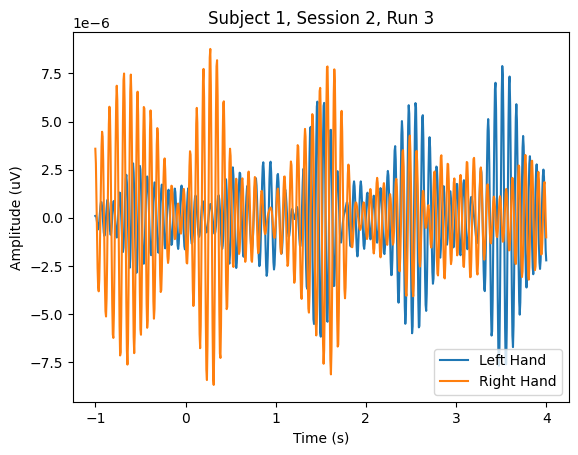

Extracting EDF parameters from /content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/S001/S001R03.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...
Used Annotations descriptions: ['T0', 'T1', 'T2']
Not setting metadata
23 matching events found
Setting baseline interval to [-1.0, 0.0] s
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 23 events and 801 original time points ...
1 bad epochs dropped
Setting up band-pass filter from 8 - 13 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 8.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 7.00 Hz)
- Upper passband edge: 13.00 Hz
- Upper transition bandwidth: 3.25 Hz (-6 dB cut

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 287 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.4s
[Parallel(n_jobs=1)]: Done 647 tasks      | elapsed:    0.5s
[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:    0.6s


Setting up band-pass filter from 13 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 13.00
- Lower transition bandwidth: 3.25 Hz (-6 dB cutoff frequency: 11.38 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 163 samples (1.019 s)



[Parallel(n_jobs=1)]: Done 1151 tasks      | elapsed:    0.7s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 287 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done 647 tasks      | elapsed:    0.4s
[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:    0.6s
[Parallel(n_jobs=1)]: Done 1151 tasks      | elapsed:    0.7s
<ipython-input-35-3cce36d29a59>:32: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  left_hand_data = epochs['left_hand'].get_data()
<ipython-input-35-3cce36d29a59>:33: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  right_hand_data = epochs['right_hand'].get_data()


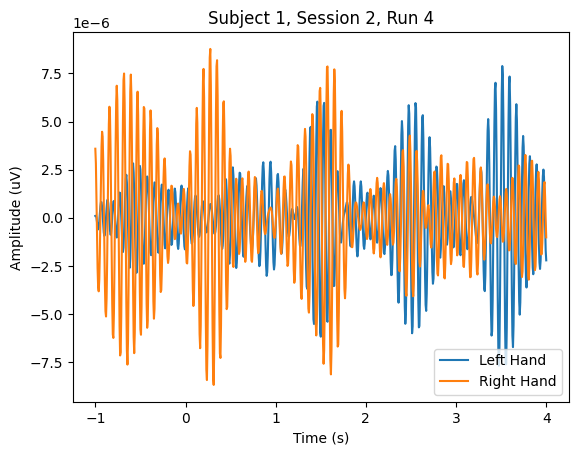

Extracting EDF parameters from /content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/S001/S001R03.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...
Used Annotations descriptions: ['T0', 'T1', 'T2']
Not setting metadata
23 matching events found
Setting baseline interval to [-1.0, 0.0] s
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 23 events and 801 original time points ...
1 bad epochs dropped
Setting up band-pass filter from 8 - 13 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 8.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 7.00 Hz)
- Upper passband edge: 13.00 Hz
- Upper transition bandwidth: 3.25 Hz (-6 dB cut

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 287 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 647 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:    0.5s
[Parallel(n_jobs=1)]: Done 1151 tasks      | elapsed:    0.6s


Setting up band-pass filter from 13 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 13.00
- Lower transition bandwidth: 3.25 Hz (-6 dB cutoff frequency: 11.38 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 163 samples (1.019 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 287 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done 647 tasks      | elapsed:    0.4s
[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:    0.5s
[Parallel(n_jobs=1)]: Done 1151 tasks      | elapsed:    0.7s
<ipython-input-35-3cce36d29a59>:32: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  left_hand_data = epochs['left_hand'].get_data()
<ipython-input-35-3cce36d29a59>:33: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  right_hand_data = epochs['right_hand'].get_data()


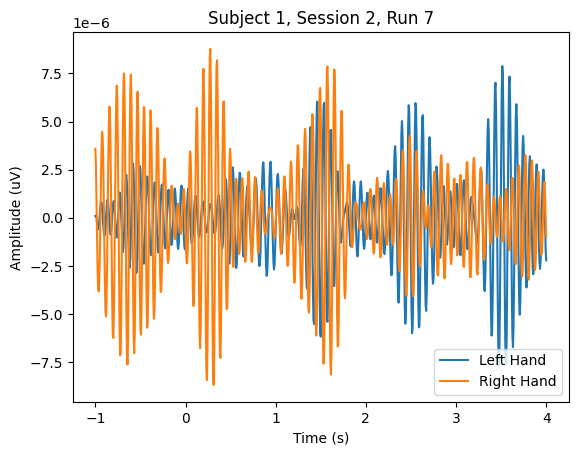

Extracting EDF parameters from /content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/S001/S001R03.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...
Used Annotations descriptions: ['T0', 'T1', 'T2']
Not setting metadata
23 matching events found
Setting baseline interval to [-1.0, 0.0] s
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 23 events and 801 original time points ...
1 bad epochs dropped
Setting up band-pass filter from 8 - 13 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 8.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 7.00 Hz)
- Upper passband edge: 13.00 Hz
- Upper transition bandwidth: 3.25 Hz (-6 dB cut

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 287 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 647 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:    0.4s
[Parallel(n_jobs=1)]: Done 1151 tasks      | elapsed:    0.5s


Setting up band-pass filter from 13 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 13.00
- Lower transition bandwidth: 3.25 Hz (-6 dB cutoff frequency: 11.38 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 163 samples (1.019 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 287 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done 647 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:    0.4s
[Parallel(n_jobs=1)]: Done 1151 tasks      | elapsed:    0.5s
<ipython-input-35-3cce36d29a59>:32: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  left_hand_data = epochs['left_hand'].get_data()
<ipython-input-35-3cce36d29a59>:33: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  right_hand_data = epochs['right_hand'].get_data()


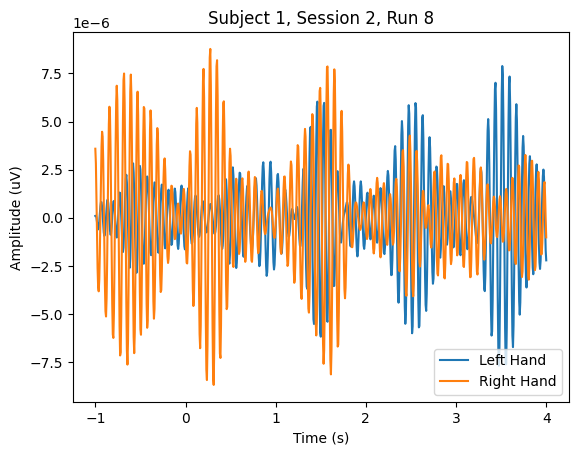

Extracting EDF parameters from /content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/S001/S001R03.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...
Used Annotations descriptions: ['T0', 'T1', 'T2']
Not setting metadata
23 matching events found
Setting baseline interval to [-1.0, 0.0] s
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 23 events and 801 original time points ...
1 bad epochs dropped
Setting up band-pass filter from 8 - 13 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 8.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 7.00 Hz)
- Upper passband edge: 13.00 Hz
- Upper transition bandwidth: 3.25 Hz (-6 dB cut

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 287 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 647 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:    0.4s
[Parallel(n_jobs=1)]: Done 1151 tasks      | elapsed:    0.5s


Setting up band-pass filter from 13 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 13.00
- Lower transition bandwidth: 3.25 Hz (-6 dB cutoff frequency: 11.38 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 163 samples (1.019 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 287 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done 647 tasks      | elapsed:    0.4s
[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:    0.4s
[Parallel(n_jobs=1)]: Done 1151 tasks      | elapsed:    0.5s
<ipython-input-35-3cce36d29a59>:32: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  left_hand_data = epochs['left_hand'].get_data()
<ipython-input-35-3cce36d29a59>:33: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  right_hand_data = epochs['right_hand'].get_data()


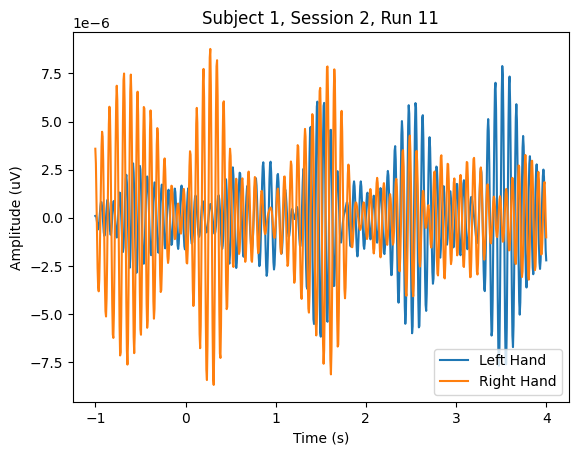

Extracting EDF parameters from /content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/S001/S001R03.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...
Used Annotations descriptions: ['T0', 'T1', 'T2']
Not setting metadata
23 matching events found
Setting baseline interval to [-1.0, 0.0] s
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 23 events and 801 original time points ...
1 bad epochs dropped
Setting up band-pass filter from 8 - 13 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 8.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 7.00 Hz)
- Upper passband edge: 13.00 Hz
- Upper transition bandwidth: 3.25 Hz (-6 dB cut

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 287 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 647 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:    0.4s


Setting up band-pass filter from 13 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 13.00
- Lower transition bandwidth: 3.25 Hz (-6 dB cutoff frequency: 11.38 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 163 samples (1.019 s)



[Parallel(n_jobs=1)]: Done 1151 tasks      | elapsed:    0.5s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 287 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 647 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:    0.5s
[Parallel(n_jobs=1)]: Done 1151 tasks      | elapsed:    0.6s
<ipython-input-35-3cce36d29a59>:32: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  left_hand_data = epochs['left_hand'].get_data()
<ipython-input-35-3cce36d29a59>:33: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  right_hand_data = epochs['right_hand'].get_data()


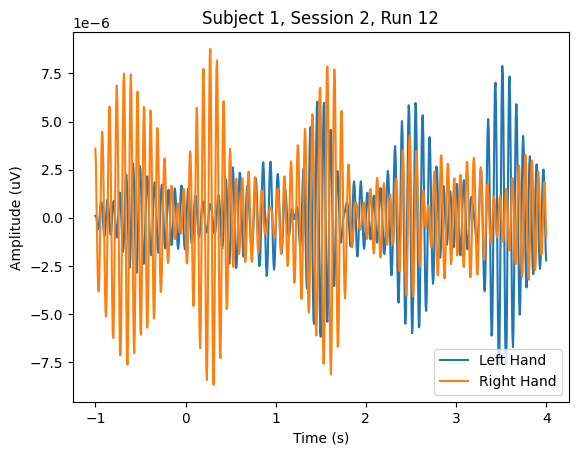

Extracting EDF parameters from /content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/S001/S001R03.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...
Used Annotations descriptions: ['T0', 'T1', 'T2']
Not setting metadata
23 matching events found
Setting baseline interval to [-1.0, 0.0] s
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 23 events and 801 original time points ...
1 bad epochs dropped
Setting up band-pass filter from 8 - 13 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 8.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 7.00 Hz)
- Upper passband edge: 13.00 Hz
- Upper transition bandwidth: 3.25 Hz (-6 dB cut

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 287 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 647 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:    0.4s


Setting up band-pass filter from 13 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 13.00
- Lower transition bandwidth: 3.25 Hz (-6 dB cutoff frequency: 11.38 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 163 samples (1.019 s)



[Parallel(n_jobs=1)]: Done 1151 tasks      | elapsed:    0.5s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 287 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 647 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:    0.5s
[Parallel(n_jobs=1)]: Done 1151 tasks      | elapsed:    0.6s
<ipython-input-35-3cce36d29a59>:32: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  left_hand_data = epochs['left_hand'].get_data()
<ipython-input-35-3cce36d29a59>:33: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  right_hand_data = epochs['right_hand'].get_data()


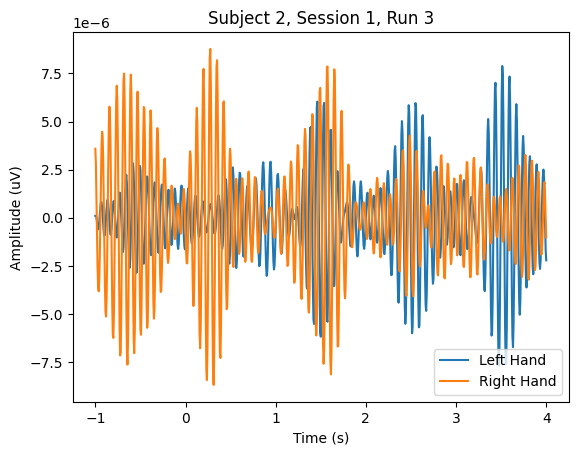

Extracting EDF parameters from /content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/S001/S001R03.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...
Used Annotations descriptions: ['T0', 'T1', 'T2']
Not setting metadata
23 matching events found
Setting baseline interval to [-1.0, 0.0] s
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 23 events and 801 original time points ...
1 bad epochs dropped
Setting up band-pass filter from 8 - 13 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 8.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 7.00 Hz)
- Upper passband edge: 13.00 Hz
- Upper transition bandwidth: 3.25 Hz (-6 dB cut

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 287 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 647 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:    0.4s
[Parallel(n_jobs=1)]: Done 1151 tasks      | elapsed:    0.5s


Setting up band-pass filter from 13 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 13.00
- Lower transition bandwidth: 3.25 Hz (-6 dB cutoff frequency: 11.38 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 163 samples (1.019 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 287 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 647 tasks      | elapsed:    0.4s
[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:    0.5s
[Parallel(n_jobs=1)]: Done 1151 tasks      | elapsed:    0.6s
<ipython-input-35-3cce36d29a59>:32: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  left_hand_data = epochs['left_hand'].get_data()
<ipython-input-35-3cce36d29a59>:33: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  right_hand_data = epochs['right_hand'].get_data()


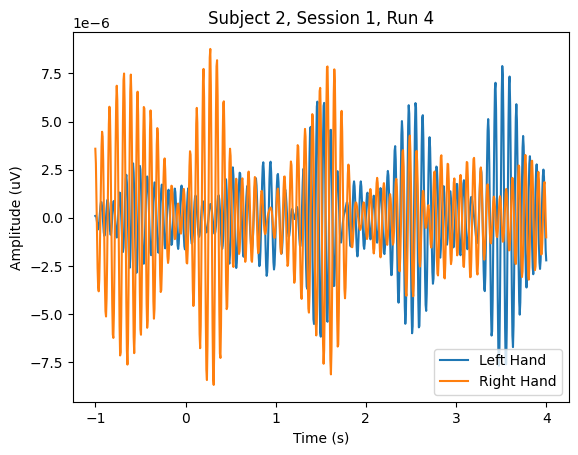

Extracting EDF parameters from /content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/S001/S001R03.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...
Used Annotations descriptions: ['T0', 'T1', 'T2']
Not setting metadata
23 matching events found
Setting baseline interval to [-1.0, 0.0] s
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 23 events and 801 original time points ...
1 bad epochs dropped
Setting up band-pass filter from 8 - 13 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 8.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 7.00 Hz)
- Upper passband edge: 13.00 Hz
- Upper transition bandwidth: 3.25 Hz (-6 dB cut

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 287 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 647 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:    0.4s


Setting up band-pass filter from 13 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 13.00
- Lower transition bandwidth: 3.25 Hz (-6 dB cutoff frequency: 11.38 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 163 samples (1.019 s)



[Parallel(n_jobs=1)]: Done 1151 tasks      | elapsed:    0.6s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 287 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done 647 tasks      | elapsed:    0.4s
[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:    0.6s
[Parallel(n_jobs=1)]: Done 1151 tasks      | elapsed:    0.7s
<ipython-input-35-3cce36d29a59>:32: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  left_hand_data = epochs['left_hand'].get_data()
<ipython-input-35-3cce36d29a59>:33: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  right_hand_data = epochs['right_hand'].get_data()


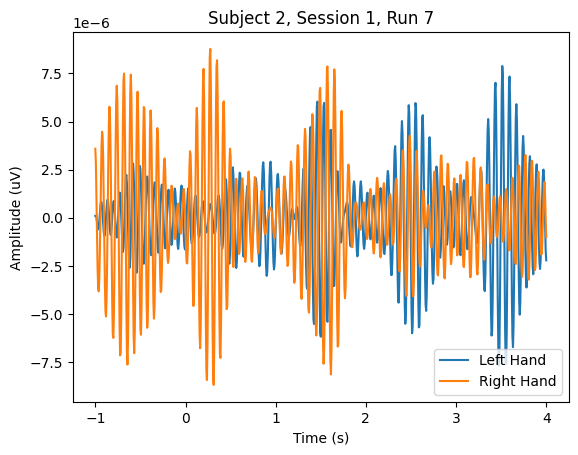

Extracting EDF parameters from /content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/S001/S001R03.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...
Used Annotations descriptions: ['T0', 'T1', 'T2']
Not setting metadata
23 matching events found
Setting baseline interval to [-1.0, 0.0] s
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 23 events and 801 original time points ...
1 bad epochs dropped
Setting up band-pass filter from 8 - 13 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 8.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 7.00 Hz)
- Upper passband edge: 13.00 Hz
- Upper transition bandwidth: 3.25 Hz (-6 dB cut

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 287 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 647 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:    0.4s


Setting up band-pass filter from 13 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 13.00
- Lower transition bandwidth: 3.25 Hz (-6 dB cutoff frequency: 11.38 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 163 samples (1.019 s)



[Parallel(n_jobs=1)]: Done 1151 tasks      | elapsed:    0.6s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 287 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done 647 tasks      | elapsed:    0.4s
[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:    0.5s
[Parallel(n_jobs=1)]: Done 1151 tasks      | elapsed:    0.6s
<ipython-input-35-3cce36d29a59>:32: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  left_hand_data = epochs['left_hand'].get_data()
<ipython-input-35-3cce36d29a59>:33: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  right_hand_data = epochs['right_hand'].get_data()


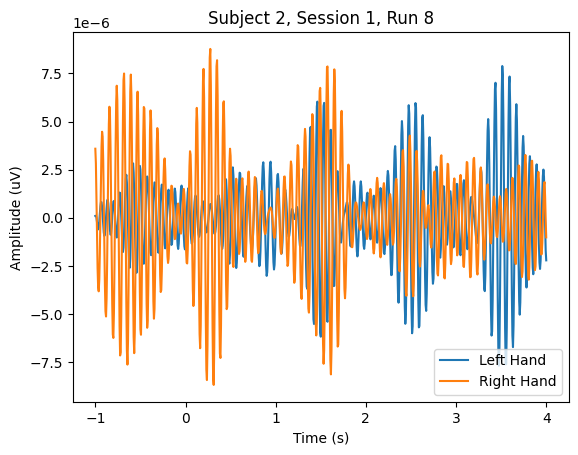

Extracting EDF parameters from /content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/S001/S001R03.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...
Used Annotations descriptions: ['T0', 'T1', 'T2']
Not setting metadata
23 matching events found
Setting baseline interval to [-1.0, 0.0] s
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 23 events and 801 original time points ...
1 bad epochs dropped
Setting up band-pass filter from 8 - 13 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 8.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 7.00 Hz)
- Upper passband edge: 13.00 Hz
- Upper transition bandwidth: 3.25 Hz (-6 dB cut

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 287 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 647 tasks      | elapsed:    0.4s
[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:    0.5s
[Parallel(n_jobs=1)]: Done 1151 tasks      | elapsed:    0.6s


Setting up band-pass filter from 13 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 13.00
- Lower transition bandwidth: 3.25 Hz (-6 dB cutoff frequency: 11.38 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 163 samples (1.019 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 287 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done 647 tasks      | elapsed:    0.4s
[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:    0.6s
[Parallel(n_jobs=1)]: Done 1151 tasks      | elapsed:    0.7s
<ipython-input-35-3cce36d29a59>:32: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  left_hand_data = epochs['left_hand'].get_data()
<ipython-input-35-3cce36d29a59>:33: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  right_hand_data = epochs['right_hand'].get_data()


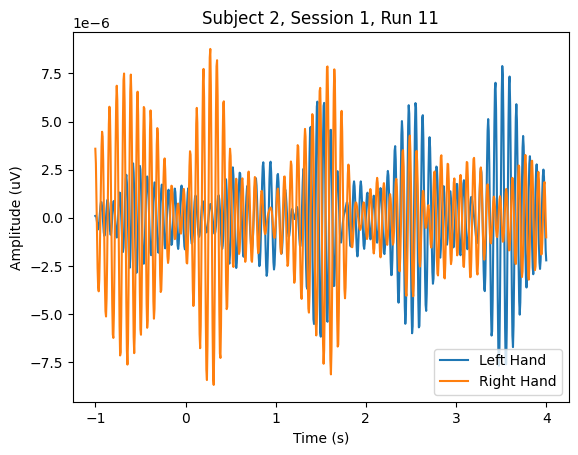

Extracting EDF parameters from /content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/S001/S001R03.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...
Used Annotations descriptions: ['T0', 'T1', 'T2']
Not setting metadata
23 matching events found
Setting baseline interval to [-1.0, 0.0] s
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 23 events and 801 original time points ...
1 bad epochs dropped
Setting up band-pass filter from 8 - 13 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 8.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 7.00 Hz)
- Upper passband edge: 13.00 Hz
- Upper transition bandwidth: 3.25 Hz (-6 dB cut

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 287 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done 647 tasks      | elapsed:    0.4s
[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:    0.5s
[Parallel(n_jobs=1)]: Done 1151 tasks      | elapsed:    0.6s


Setting up band-pass filter from 13 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 13.00
- Lower transition bandwidth: 3.25 Hz (-6 dB cutoff frequency: 11.38 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 163 samples (1.019 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 287 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done 647 tasks      | elapsed:    0.4s
[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:    0.5s
[Parallel(n_jobs=1)]: Done 1151 tasks      | elapsed:    0.7s
<ipython-input-35-3cce36d29a59>:32: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  left_hand_data = epochs['left_hand'].get_data()
<ipython-input-35-3cce36d29a59>:33: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  right_hand_data = epochs['right_hand'].get_data()


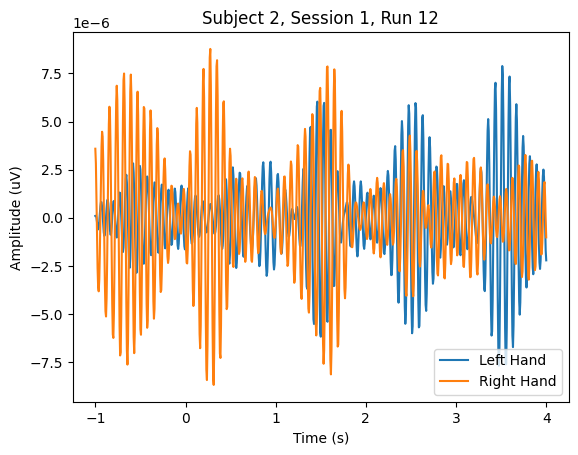

Extracting EDF parameters from /content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/S001/S001R03.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...
Used Annotations descriptions: ['T0', 'T1', 'T2']
Not setting metadata
23 matching events found
Setting baseline interval to [-1.0, 0.0] s
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 23 events and 801 original time points ...
1 bad epochs dropped
Setting up band-pass filter from 8 - 13 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 8.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 7.00 Hz)
- Upper passband edge: 13.00 Hz
- Upper transition bandwidth: 3.25 Hz (-6 dB cut

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 287 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 647 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:    0.4s


Setting up band-pass filter from 13 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 13.00
- Lower transition bandwidth: 3.25 Hz (-6 dB cutoff frequency: 11.38 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 163 samples (1.019 s)



[Parallel(n_jobs=1)]: Done 1151 tasks      | elapsed:    0.6s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 287 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done 647 tasks      | elapsed:    0.4s
[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:    0.6s
[Parallel(n_jobs=1)]: Done 1151 tasks      | elapsed:    0.7s
<ipython-input-35-3cce36d29a59>:32: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  left_hand_data = epochs['left_hand'].get_data()
<ipython-input-35-3cce36d29a59>:33: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  right_hand_data = epochs['right_hand'].get_data()


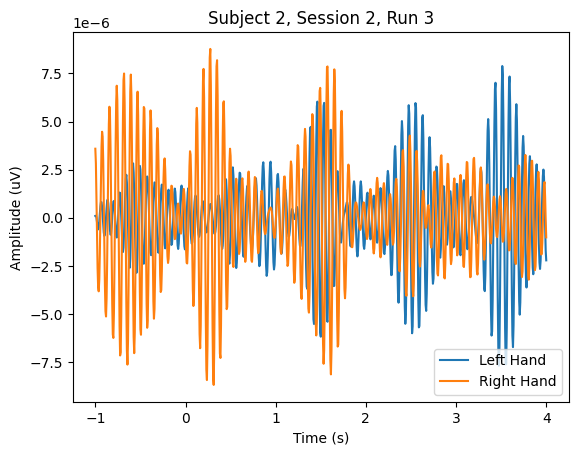

Extracting EDF parameters from /content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/S001/S001R03.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...
Used Annotations descriptions: ['T0', 'T1', 'T2']
Not setting metadata
23 matching events found
Setting baseline interval to [-1.0, 0.0] s
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 23 events and 801 original time points ...
1 bad epochs dropped
Setting up band-pass filter from 8 - 13 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 8.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 7.00 Hz)
- Upper passband edge: 13.00 Hz
- Upper transition bandwidth: 3.25 Hz (-6 dB cut

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 287 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 647 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:    0.4s
[Parallel(n_jobs=1)]: Done 1151 tasks      | elapsed:    0.5s


Setting up band-pass filter from 13 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 13.00
- Lower transition bandwidth: 3.25 Hz (-6 dB cutoff frequency: 11.38 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 163 samples (1.019 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 287 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 647 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:    0.5s
[Parallel(n_jobs=1)]: Done 1151 tasks      | elapsed:    0.6s
<ipython-input-35-3cce36d29a59>:32: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  left_hand_data = epochs['left_hand'].get_data()
<ipython-input-35-3cce36d29a59>:33: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  right_hand_data = epochs['right_hand'].get_data()


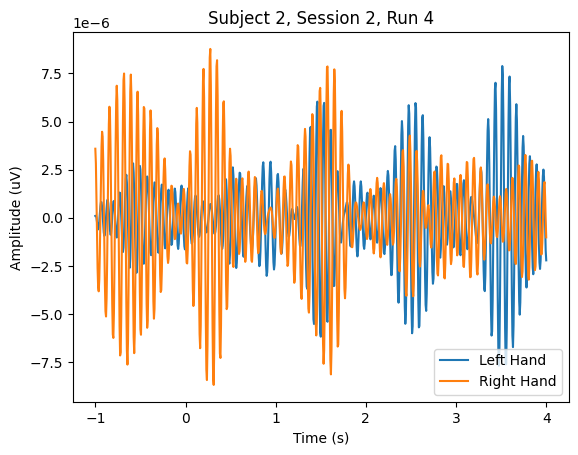

Extracting EDF parameters from /content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/S001/S001R03.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...


KeyboardInterrupt: 

In [ ]:
# Define the runs of interest
runs_of_interest = [3, 4, 7, 8, 11, 12]

# Specify the frequency bands of interest (Mu: 8-13 Hz, Beta: 13-30 Hz)
mu_band = (8, 13)
beta_band = (13, 30)

# Iterate through all subjects
for subject in range(1, 10):  # Assuming subjects S01 to S09

    for session in range(1, 3):  # Assuming two sessions for each subject

        for run in runs_of_interest:

            # Load the EEG data
            raw = mne.io.read_raw_edf(f'{data_path}S{subject_id:03d}/S{subject_id:03d}R{session_id:02d}.edf', preload=True)

            # Extract events based on triggers
            events, _ = mne.events_from_annotations(raw)

            # Specify the event ID based on your data (assuming left hand and right hand movements)
            event_id = dict(left_hand=1, right_hand=2)

            # Create epochs
            epochs = mne.Epochs(raw, events=events, event_id=event_id, tmin=-1, tmax=4, baseline=(None, 0), preload=True)

            # Apply bandpass filtering to focus on Mu and Beta frequencies
            epochs.filter(mu_band[0], mu_band[1], fir_design='firwin')
            epochs.filter(beta_band[0], beta_band[1], fir_design='firwin')

            # Get the EEG data for left and right hand movements
            left_hand_data = epochs['left_hand'].get_data()
            right_hand_data = epochs['right_hand'].get_data()

            # Calculate the average over trials for left and right hand movements
            avg_left_hand = np.mean(left_hand_data, axis=0)
            avg_right_hand = np.mean(right_hand_data, axis=0)

            # Plot the average signals for left and right hand movements
            times = epochs.times
            plt.figure()
            plt.plot(times, avg_left_hand[0, :], label='Left Hand')
            plt.plot(times, avg_right_hand[0, :], label='Right Hand')
            plt.title(f'Subject {subject}, Session {session}, Run {run}')
            plt.xlabel('Time (s)')
            plt.ylabel('Amplitude (uV)')
            plt.legend()
            plt.show()

**Existe interfência interhemisferica?**

A interferência inter-hemisférica nos dados de EEG refere-se à influência ou comunicação entre os hemisférios esquerdo e direito do cérebro. Os sinais de EEG podem ser influenciados pela atividade neural intra-hemisférica e inter-hemisférica.

Algumas considerações sobre a interferência entre os hemisférios nos dados de EEG em relação aos seguintes aspecto e propriedades:

A Coerência Inter-Hemisférica que mede o grau de sincronização entre os sinais registrados em diferentes regiões do cérebro. Ela pode indicar o nível de comunicação ou interferência entre os hemisférios esquerdo e direito.

A análise de conectividade Inter-Hemisférica, como a conectividade funcional ou a análise de coerência, pode revelar padrões de comunicação entre diferentes regiões do cérebro, incluindo aquelas em diferentes hemisférios.


O corpo caloso é uma estrutura que conecta os hemisférios esquerdo e direito. As interações calosas, através do corpo caloso, podem influenciar os sinais de EEG, especialmente durante tarefas que envolvem coordenação entre hemisférios.

Além disso, existem os aspectos de lateralidade, pelos quais algumas tarefas ou estímulos podem provocar respostas mais fortes num hemisfério, levando a efeitos lateralizados. A interferência entre os hemisférios pode depender de cada tarefa.


Para investigar a interferência inter-hemisférica nos dados de EEG, podem ser realizadas algumas análises, tais como conectividade funcional, simetria hemisférica, potenciais relacionados a eventos, localização da fonte do sinal, entre outras.  Todas elas, com seu objetivo especifico.

Na análise de conectividade funcional calcula-se a coerência ou outras medidas de conectividade para avaliar o grau de sincronização entre os sinais de EEG de diferentes regiões hemisféricas.


Na análise de Assimetria Hemisférica, investiga-se as diferenças na atividade do EEG entre os hemisférios procurando padrões de assimetria que possam sugerir interferência ou coordenação.

A análise de Potenciais Relacionados a Eventos (ERPs), tambpem chamados de potenciais evocados, identifica componentes associados ao processamento inter-hemisférico. O componente P300 pode envolver ambos os hemisférios e refletir processos de atenção.

Existem também as técnicas de localização de fontes para estimar os geradores neurais de sinais de EEG e identificar regiões de interesse em ambos os hemisférios.


O algoritmo abaixo é exemplo simplificado, na liguagem Python, utilizando a biblioteca de códigos MNE para calcular a coerência inter-hemisférica




 é possivel identificar? por exemplo, assume-se que o indivuo nao pensou, nem tampouco movimentou a mao contraria por enganos e depis se corrigiu e vice-versa?

In [ ]:
# Define left and right hemisphere electrode groups
left_hemisphere_electrodes = ['F3..', 'C3..', 'P3..', 'O1..']
right_hemisphere_electrodes = ['F4..', 'C4..', 'P4..', 'O2..']

# Extract data for left and right hemispheres
left_hemisphere_data = raw.copy().pick_channels(left_hemisphere_electrodes)._data
right_hemisphere_data = raw.copy().pick_channels(right_hemisphere_electrodes)._data

# Compute coherence between left and right hemispheres
coherence, freqs, times, n_epochs, n_tapers = mne.time_frequency.spectral_connectivity(
    [left_hemisphere_data, right_hemisphere_data],
    method='coh', mode='multitaper', sfreq=raw.info['sfreq'], fmin=8, fmax=30, faverage=True)

# Plot coherence results
plt.plot(freqs, coherence[0, 1, :])
plt.xlabel('Frequency (Hz)')
plt.ylabel('Coherence')
plt.title('Inter-Hemispheric Coherence')
plt.show()

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


<ipython-input-9-d130749f0914>:6: FutureWarning: The default for pick_channels will change from ordered=False to ordered=True in 1.5 and this will result in a change of behavior because the resulting channel order will not match. Either use a channel order that matches your instance or pass ordered=False.
  left_hemisphere_data = raw.copy().pick_channels(left_hemisphere_electrodes)._data
<ipython-input-9-d130749f0914>:7: FutureWarning: The default for pick_channels will change from ordered=False to ordered=True in 1.5 and this will result in a change of behavior because the resulting channel order will not match. Either use a channel order that matches your instance or pass ordered=False.
  right_hemisphere_data = raw.copy().pick_channels(right_hemisphere_electrodes)._data


AttributeError: No mne.time_frequency attribute spectral_connectivity

In [ ]:
# Extract data for left and right hemispheres
left_hemisphere_data = raw.copy().pick_channels(left_hemisphere_electrodes)._data
right_hemisphere_data = raw.copy().pick_channels(right_hemisphere_electrodes)._data

# Compute coherence between left and right hemispheres
coherence, freqs, times, n_epochs, n_tapers = mne.connectivity.spectral_connectivity(
    [left_hemisphere_data, right_hemisphere_data],
    method='coh', mode='multitaper', sfreq=raw.info['sfreq'], fmin=8, fmax=30, faverage=True)

# Plot coherence results
plt.plot(freqs, coherence[0, 1, :])
plt.xlabel('Frequency (Hz)')
plt.ylabel('Coherence')
plt.title('Inter-Hemispheric Coherence')
plt.show()

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


<ipython-input-42-9973128a8a01>:2: FutureWarning: The default for pick_channels will change from ordered=False to ordered=True in 1.5 and this will result in a change of behavior because the resulting channel order will not match. Either use a channel order that matches your instance or pass ordered=False.
  left_hemisphere_data = raw.copy().pick_channels(left_hemisphere_electrodes)._data
<ipython-input-42-9973128a8a01>:3: FutureWarning: The default for pick_channels will change from ordered=False to ordered=True in 1.5 and this will result in a change of behavior because the resulting channel order will not match. Either use a channel order that matches your instance or pass ordered=False.
  right_hemisphere_data = raw.copy().pick_channels(right_hemisphere_electrodes)._data


AttributeError: No mne attribute connectivity

In [ ]:
# Extract data for left and right hemispheres
left_hemisphere_data = raw.copy().pick_channels(left_hemisphere_electrodes)._data
right_hemisphere_data = raw.copy().pick_channels(right_hemisphere_electrodes)._data

# Compute coherence between left and right hemispheres
coherence, freqs, times, n_epochs, n_tapers = mne.connectivity.spectral_connectivity(
    [left_hemisphere_data, right_hemisphere_data],
    method='coh', mode='multitaper', sfreq=raw.info['sfreq'], fmin=8, fmax=30, faverage=True)

# Plot coherence results
plt.plot(freqs, coherence[0, 1, :])
plt.xlabel('Frequency (Hz)')
plt.ylabel('Coherence')
plt.title('Inter-Hemispheric Coherence')
plt.show()

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


<ipython-input-43-9973128a8a01>:2: FutureWarning: The default for pick_channels will change from ordered=False to ordered=True in 1.5 and this will result in a change of behavior because the resulting channel order will not match. Either use a channel order that matches your instance or pass ordered=False.
  left_hemisphere_data = raw.copy().pick_channels(left_hemisphere_electrodes)._data
<ipython-input-43-9973128a8a01>:3: FutureWarning: The default for pick_channels will change from ordered=False to ordered=True in 1.5 and this will result in a change of behavior because the resulting channel order will not match. Either use a channel order that matches your instance or pass ordered=False.
  right_hemisphere_data = raw.copy().pick_channels(right_hemisphere_electrodes)._data


AttributeError: No mne attribute connectivity

**Existe diferencça do sinal entre mãos?**

Sim, existe diferença. Uma das técnicas utilizadas para demonstrar a diferênça foi utilizada acima para obtenção das médias dos sinais, apresentadas acima no gráfico em função do tempo.

Além disso, as diferenças entre os sinais da mao direita e esquerda no sinais EEG podem maniosfestar-se de diversas formas. Alguns dos aspectos mais estudados e observados pela comunidade científica são as diferenças na amplitude dos sinais, na topografia pois a localização exata, bem como a distribuição dos sinais pela região pode variar entre indivíduos.
Pela propria definição dos canais EEG representarem uma região do escalpo, por sua vez implica num intervalo de aceitável de valores que juntos determinam a localização do canal.

A distribuição topográfica dos sinais EEG pode diferir entre os movimentos da mão esquerda e direita. Locais específicos de eletrodos sobre o córtex sensório-motor podem apresentar alterações mais pronunciadas durante um tipo de movimento em comparação com outro.

Há também diferenças no conteúdo de frequencia dos sinais de cada indivíduo, para corroborar ainda mais com a distinção de cada sinal da mão esquerda e mão direita.

O conteúdo de frequência caracteriza-se por faixas de frequência específicas, como Mu (8-13 Hz) e Beta (13-30 Hz), que novamente, assim como na distribuição topográfica definem intervalos de valores, e consequentemente podem apresentar variações relacionadas ao planejamento e execução motora.

É possível, que um destro realize planejamentos de forma diferetnte à uma pessoa canhota. Ou até mesmo, o planejamento de tarefas especificas da mão esquerda gerem estímulos caracteristicos, e por sua vez sinais diferentes do plenejamento de tarefas espeficas da mão direita, como por exemplo o pegar de um copo e a escrita.


Ainda sobre as direferenças de sinais, já existem inumeras pesquisas cientificas sobre Dessincronização/sincronização relacionada a eventos (ERD/ERS).  As mudanças na potência de certas bandas de frequência são conhecidas como dessincronização relacionada a eventos (ERD) ou sincronização relacionada a eventos (ERS), e podem indicar atividade cerebral relacionada ao motor. Por exemplo, uma diminuição na potência Mu ou Beta (ERD) pode ocorrer durante o planejamento e execução motora.


A dinâmica Temporal, bem como os padrões temporais dos sinais de EEG podem ser diferentes. Por exemplo, o início e a duração de certos componentes, além dos caminhos e tipos de neuronios percorridos pelos sinais, estão diretamente relacionados ao planejamento ou execução motora e desta forma podem variar entre os movimentos da mão esquerda e da mão direita.

Para analisar essas diferenças com mais precisão, é possível utilizar métodos estatísticos, como testes t ou abordagens de aprendizado de máquina, para identificar características significativas que discriminam entre os movimentos da mão esquerda e da mão direita.

Além disso, a visualização dos sinais de EEG, da densidade espectral de potência ou de mapas topográficos durante diferentes tarefas motoras pode fornecer insights sobre os aspectos espaciais e temporais das diferenças.



**Qual a estabilidade do padrão no tempo?**




Extracting EDF parameters from /content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/S006/S006R03.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19679  =      0.000 ...   122.994 secs...
Using matplotlib as 2D backend.


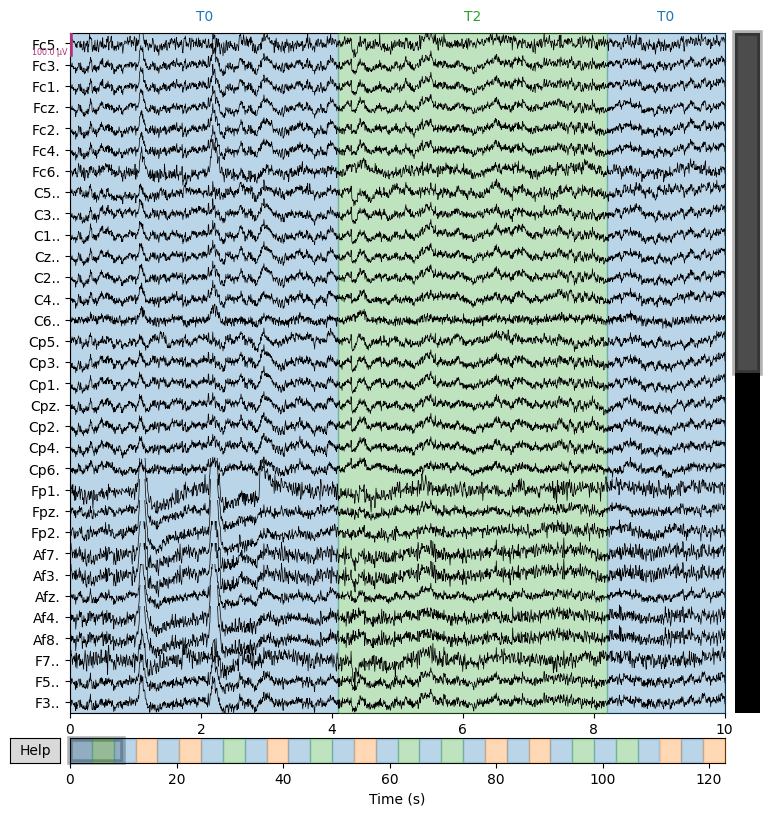

In [ ]:

# Specify the path to the dataset (change this to your actual path)
data_path  = '/content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/'

# Define the subject and recording session you want to analyze
subject_id = 6
session_id = 3

# Load the EEG data using MNE
raw = mne.io.read_raw_edf(f'{data_path}S{subject_id:03d}/S{subject_id:03d}R{session_id:02d}.edf', preload=True)

# Define the time periods of interest (T0, T1, T2)
t0_start, t0_end = 0, 80  # Adjust these values based on your dataset

# Plot EEG signals for each time period
# raw.plot(start=t1_start, duration=t1_end - t1_start, n_channels=32, scalings=dict(eeg=50e-6), title=f'Subject {subject_id}, Session {session_id}, T1')
raw.plot(n_channels=32, scalings=dict(eeg=50e-6), title=f'Subject {subject_id}, Session {session_id}, T1')

# Show the plot
plt.show()


Extracting EDF parameters from /content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/S001/S001R03.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...


<Figure size 1000x500 with 0 Axes>

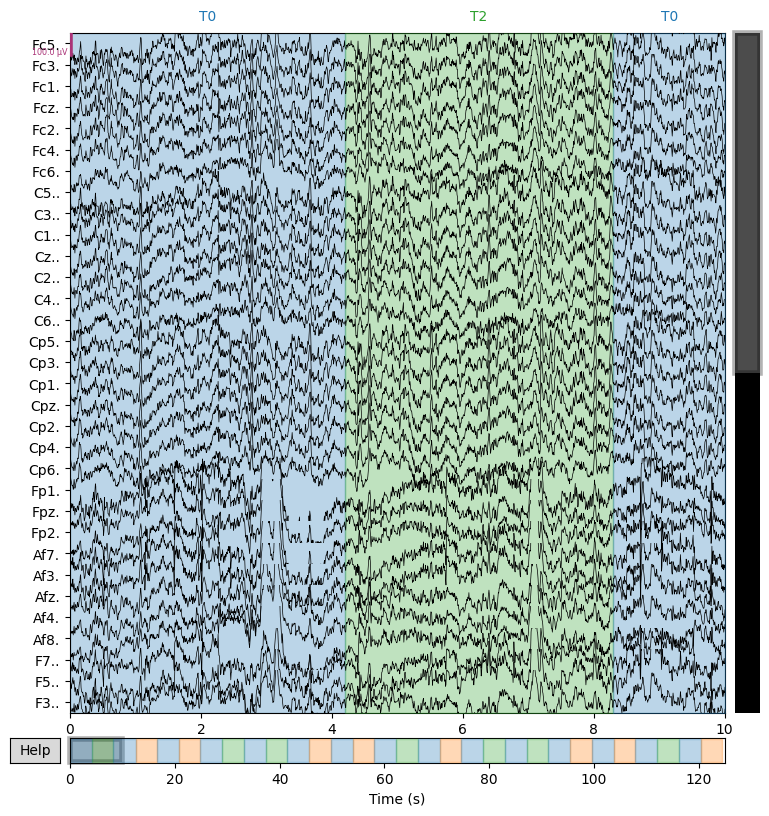

Extracting EDF parameters from /content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/S001/S001R04.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...


<Figure size 1000x500 with 0 Axes>

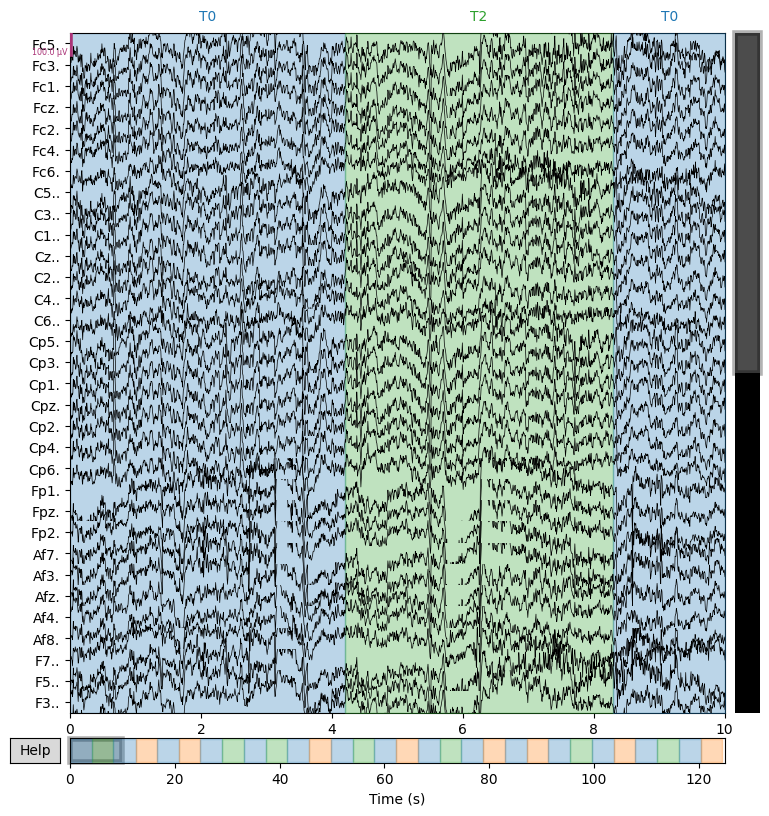

Extracting EDF parameters from /content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/S001/S001R07.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...


<Figure size 1000x500 with 0 Axes>

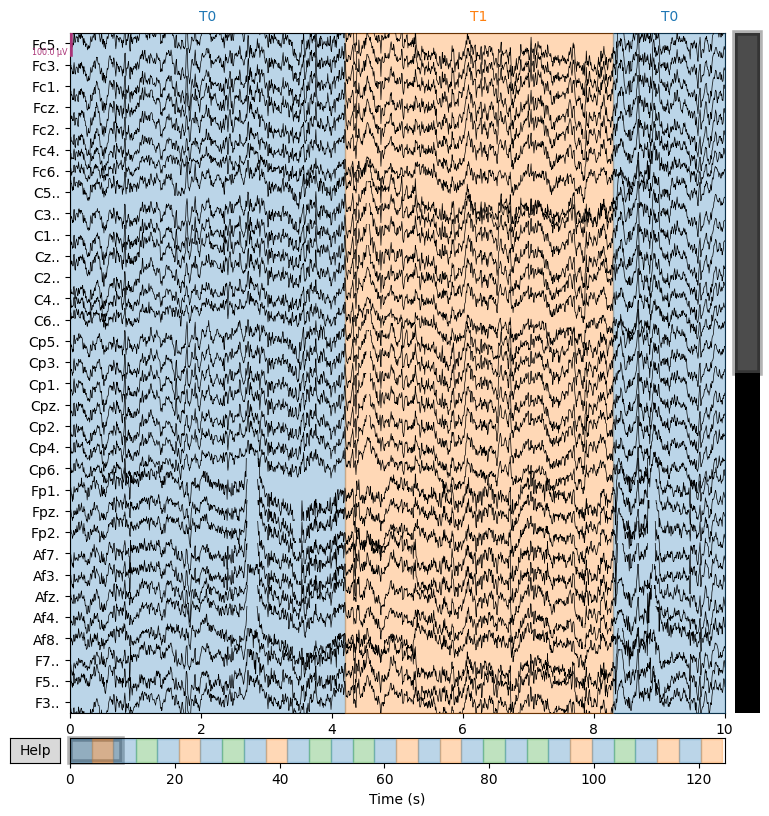

Extracting EDF parameters from /content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/S001/S001R08.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...


<Figure size 1000x500 with 0 Axes>

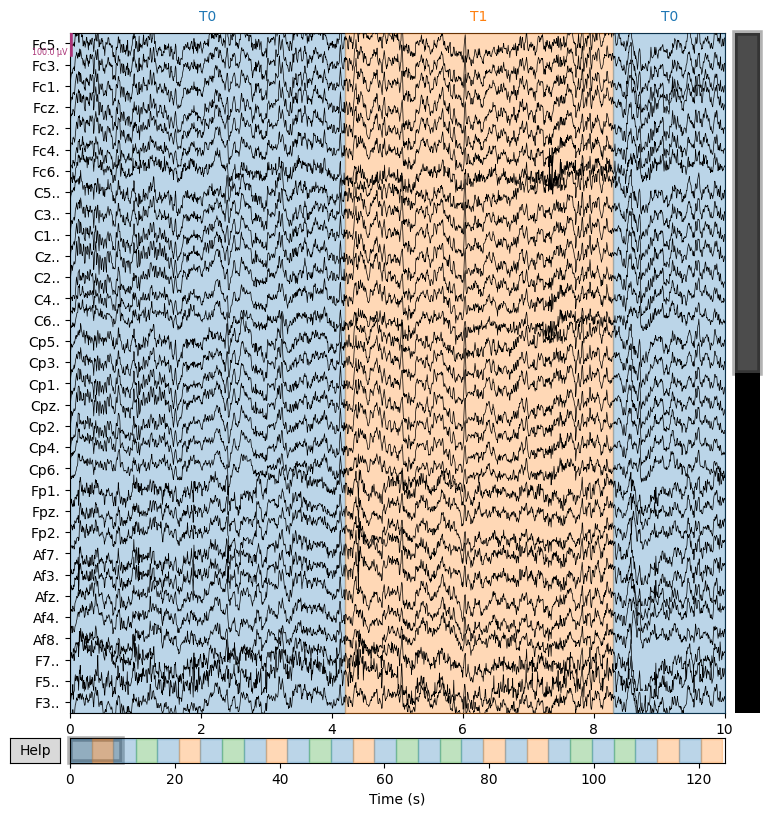

Extracting EDF parameters from /content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/S001/S001R11.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...


<Figure size 1000x500 with 0 Axes>

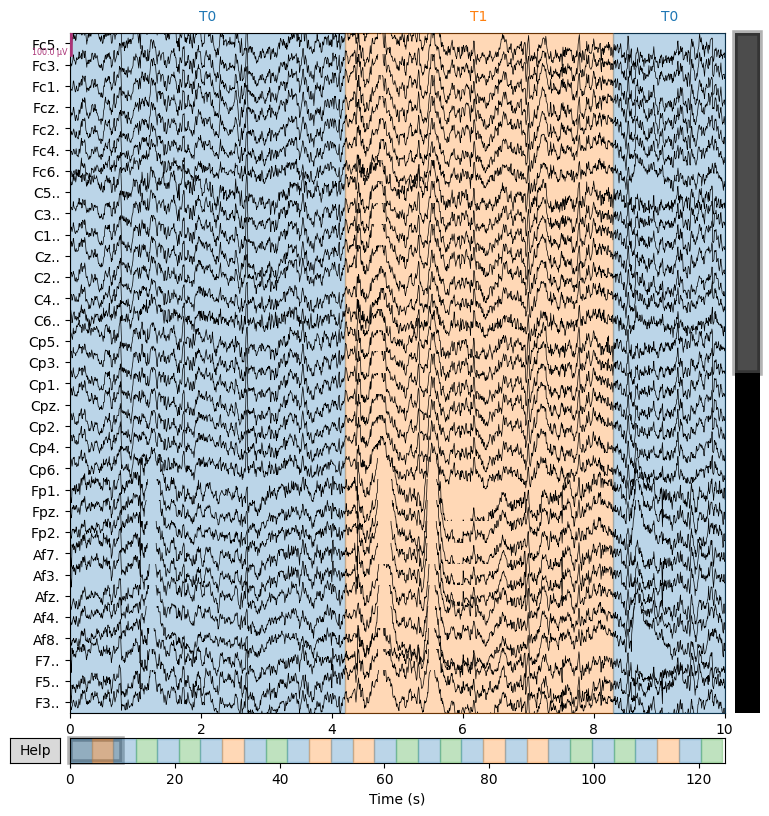

Extracting EDF parameters from /content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/S001/S001R12.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...


<Figure size 1000x500 with 0 Axes>

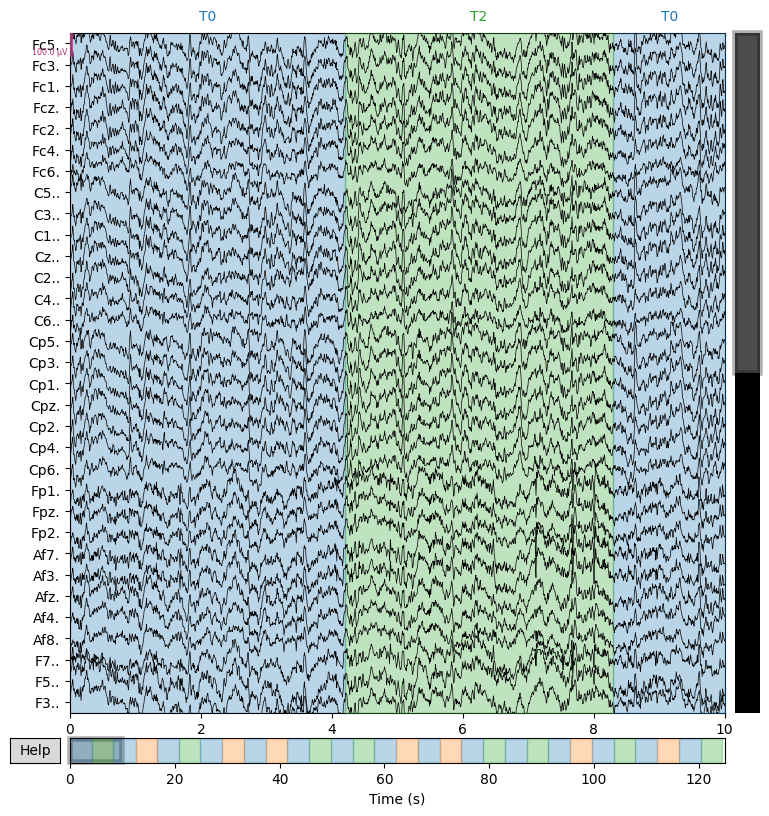

In [ ]:
# Define the subject you want to analyze
subject_id = 1

# Define the runs/sessions you need to analyze
session_ids = 3,4,7,8,11,12

# Load the EEG data for each session and plot
for session_id in (session_ids):  # Assuming there are 6 sessions, in pairs for left and right firsts, adjusted accordingly
    # Load the EEG data using MNE
    raw = mne.io.read_raw_edf(f'{data_path}S{subject_id:03d}/S{subject_id:03d}R{session_id:02d}.edf', preload=True)

    # Plot EEG signals for each session
    plt.figure(figsize=(10, 5))
    raw.plot(n_channels=32, scalings=dict(eeg=50e-6), title=f'Subject {subject_id}, Session {session_id}')

# Show the plots
plt.show()

Using default location ~/mne_data for EEGBCI...
Creating ~/mne_data


Do you want to set the path:
    /root/mne_data
as the default EEGBCI dataset path in the mne-python config [y]/n? y
Attempting to create new mne-python configuration file:
/root/.mne/mne-python.json
Download complete in 12s (7.4 MB)
Extracting EDF parameters from /root/mne_data/MNE-eegbci-data/files/eegmmidb/1.0.0/S001/S001R03.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...
Extracting EDF parameters from /root/mne_data/MNE-eegbci-data/files/eegmmidb/1.0.0/S001/S001R07.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...
Extracting EDF parameters from /root/mne_data/MNE-eegbci-data/files/eegmmidb/1.0.0/S001/S001R11.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...
Setting up low-pass filter at 40 Hz

IIR

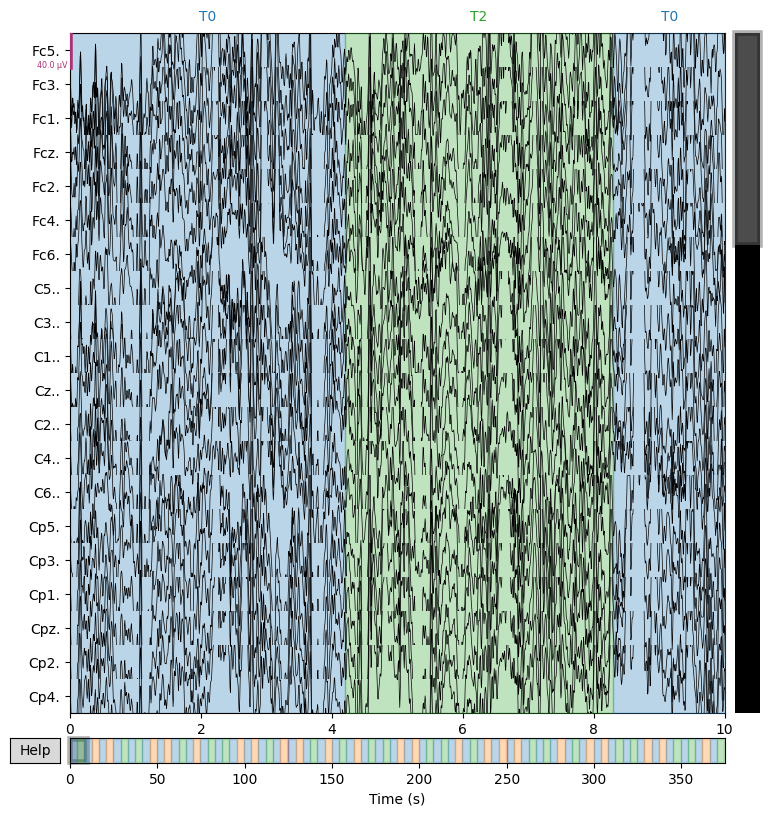

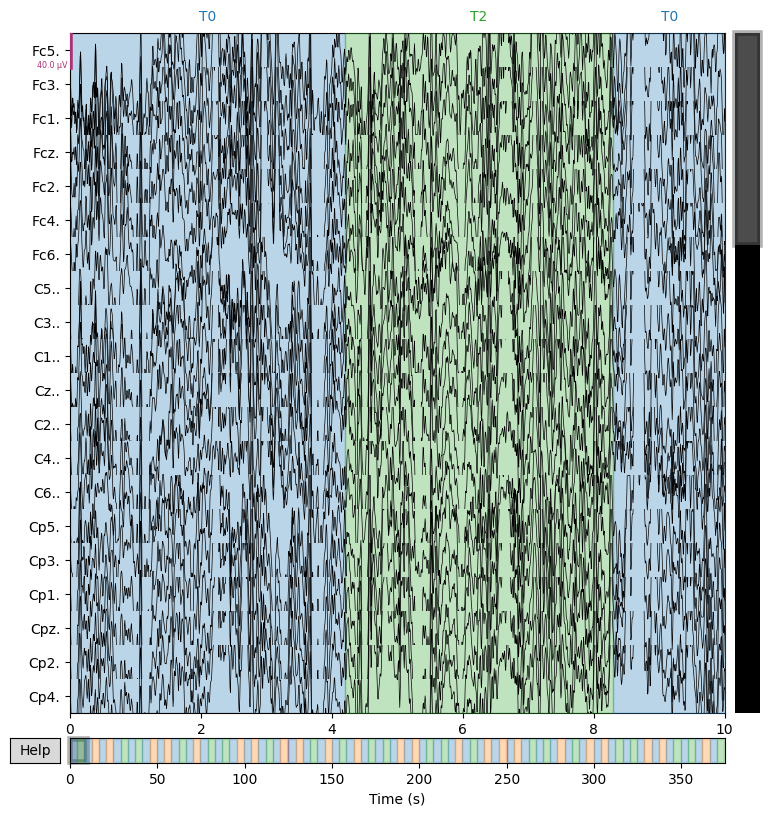

In [ ]:
# Load the EEG data
subject = 1
runs = [3, 7, 11]
raw_files = [read_raw_edf(f, preload=True) for f in eegbci.load_data(subject, runs)]
raw = concatenate_raws(raw_files)

raw.plot(block=True, lowpass=40)


# **Referências**

Schalk, G., McFarland, D.J., Hinterberger, T., Birbaumer, N., Wolpaw, J.R. BCI2000: A General-Purpose Brain-Computer Interface (BCI) System. IEEE Transactions on Biomedical Engineering 51(6):1034-1043, 2004.

Goldberger, A., Amaral, L., Glass, L., Hausdorff, J., Ivanov, P. C., Mark, R., ... & Stanley, H. E. (2000). PhysioBank, PhysioToolkit, and PhysioNet: Components of a new research resource for complex physiologic signals. Circulation [Online]. 101 (23), pp. e215–e220.

Díaz, M. R., Llanos C., Gonzalez, S., Sabate, M., How Similar Are Motor Imagery and Movement?, August 2008, Behavioral Neuroscience 122(4):910-6
DOI: 10.1037/0735-7044.122.4.910, SourcePubMed

Batistić, L.; Sušanj, D.; Pinčić, D.; Ljubic, S. Motor Imagery Classification Based on EEG Sensing with Visual and Vibrotactile Guidance. Sensors 2023, 23, 5064. https://doi.org/10.3390/s23115064

# **Anexo**

# Documentação e Referências do conjunto de dados
https://www.physionet.org/content/eegmmidb/1.0.0/

Este conjunto de dados consiste em mais de 1.500 registros de EEG de um e dois minutos, obtidos de 109 voluntários, conforme descrito abaixo.

**Protocolo experimental**

Os indivíduos realizaram diferentes tarefas motoras/imagéticas enquanto o EEG de 64 canais foi registrado usando o sistema BCI2000 (//www.bci2000.org). Cada sujeito realizou 14 corridas experimentais: duas corridas de linha de base de um minuto (uma com os olhos abertos, outra com os olhos fechados) e três corridas de dois minutos de cada uma das quatro tarefas a seguir:

Um alvo aparece no lado esquerdo ou direito da tela. O sujeito abre e fecha o punho correspondente até que o alvo desapareça. Então o indivíduo relaxa.
Um alvo aparece no lado esquerdo ou direito da tela. O sujeito imagina abrir e fechar o punho correspondente até que o alvo desapareça. Então o indivíduo relaxa.

Um alvo aparece na parte superior ou inferior da tela. O alvo abre e fecha ambos os punhos (se o alvo estiver em cima) ou ambos os pés (se o alvo estiver em baixo) até que o alvo desapareça. Então o indivíduo relaxa.

Um alvo aparece na parte superior ou inferior da tela. O sujeito imagina abrir e fechar ambos os punhos (se o alvo estiver em cima) ou ambos os pés (se o alvo estiver em baixo) até que o alvo desapareça. Então o indivíduo relaxa.

Em experimentos de EEG, os dados são frequentemente coletados de vários sujeitos e sessões. Os parâmetros subject_id e session_id são usados para especificar quais dados do sujeito e sessão de gravação você deseja analisar.

**subject_id:** Refere-se ao identificador exclusivo atribuído a cada participante ou sujeito do experimento. Geralmente é um número inteiro e cada sujeito possui um ID exclusivo. Os IDs geralmente são atribuídos sequencialmente, começando em 1. Você precisaria verificar a documentação ou a organização do conjunto de dados para saber o intervalo de IDs de assunto disponíveis em seu conjunto de dados.

**session_id:** Refere-se ao identificador exclusivo de uma sessão de gravação dentro de um assunto. Em alguns conjuntos de dados de EEG, múltiplas sessões podem ser gravadas para cada sujeito. O ID da sessão é usado para distinguir entre diferentes sessões de gravação para o mesmo assunto. Semelhante ao subject_id, você precisaria verificar a documentação do conjunto de dados para entender o intervalo de IDs de sessão disponíveis para cada assunto.

Para determinar os melhores valores para subject_id e session_id:

Verifique a documentação do conjunto de dados: consulte a documentação ou as informações fornecidas com o conjunto de dados. Deve especificar o intervalo de IDs de assunto e IDs de sessão disponíveis no conjunto de dados.

Cada anotação inclui um dos três (T0, T1, or T2):

**T0** corresponds to rest

**T1** corresponds to onset of motion (real or imagined) of
the left fist (in runs 3, 4, 7, 8, 11, and 12)
both fists (in runs 5, 6, 9, 10, 13, and 14)

**T2** corresponds to onset of motion (real or imagined) of
the right fist (in runs 3, 4, 7, 8, 11, and 12)
both feet (in runs 5, 6, 9, 10, 13, and 14)


Explorar a estrutura do conjunto de dados: examine a estrutura do conjunto de dados. A pasta do conjunto de dados pode ser organizada por assuntos e sessões. Verifique a estrutura de diretórios ou as convenções de nomenclatura de arquivos para entender como os assuntos e as sessões são organizados.

Tentativa e erro: você pode começar tentando pequenos valores inteiros para subject_id (por exemplo, 1, 2, 3) e session_id (por exemplo, 1, 2, 3) e ver se os dados são carregados com sucesso. Se você encontrar erros ou dados ausentes, ajuste os valores adequadamente.


## **Representação gráfica dos sinais EEG, dos 32 canais, das 6 rodadas de cada um dos 10 indivíduos presentes no experimento.**

Extracting EDF parameters from /content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/S001/S001R03.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...
Using matplotlib as 2D backend.


<Figure size 500x500 with 0 Axes>

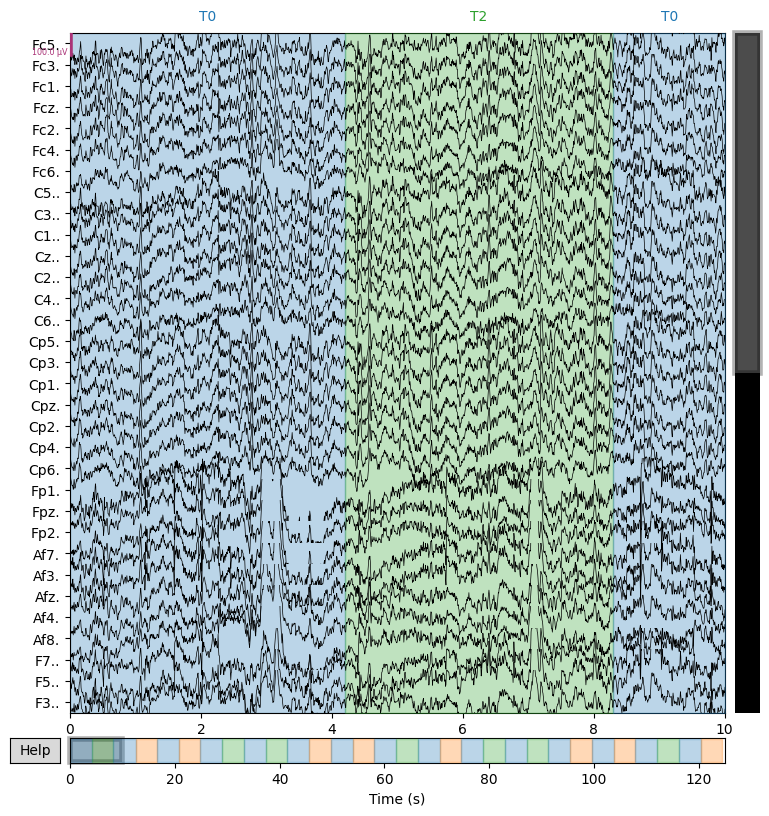

Extracting EDF parameters from /content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/S001/S001R04.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...


<Figure size 500x500 with 0 Axes>

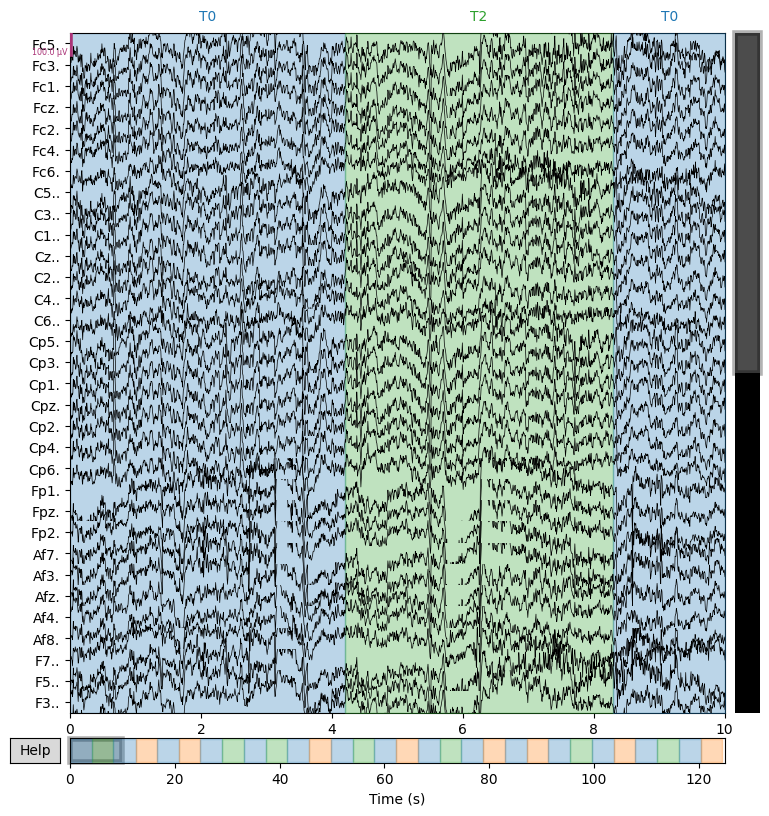

Extracting EDF parameters from /content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/S001/S001R07.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...


<Figure size 500x500 with 0 Axes>

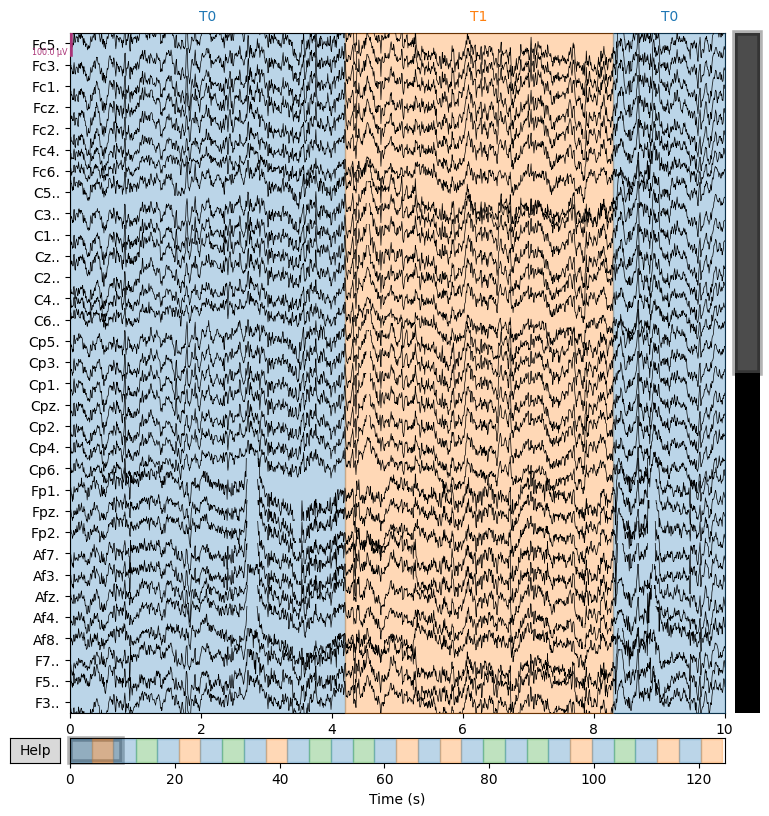

Extracting EDF parameters from /content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/S001/S001R08.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...


<Figure size 500x500 with 0 Axes>

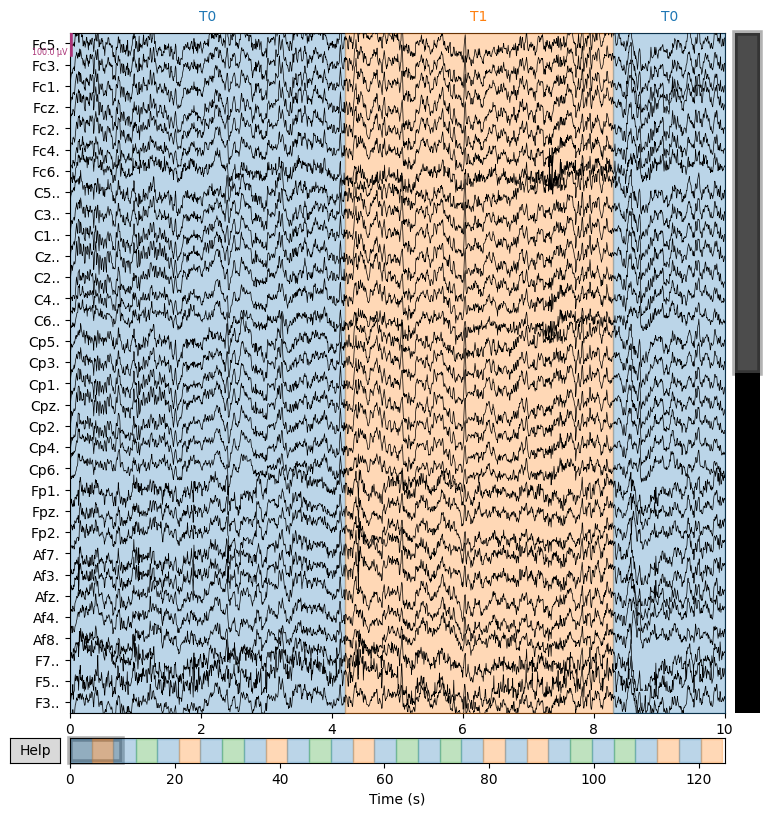

Extracting EDF parameters from /content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/S001/S001R11.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...


<Figure size 500x500 with 0 Axes>

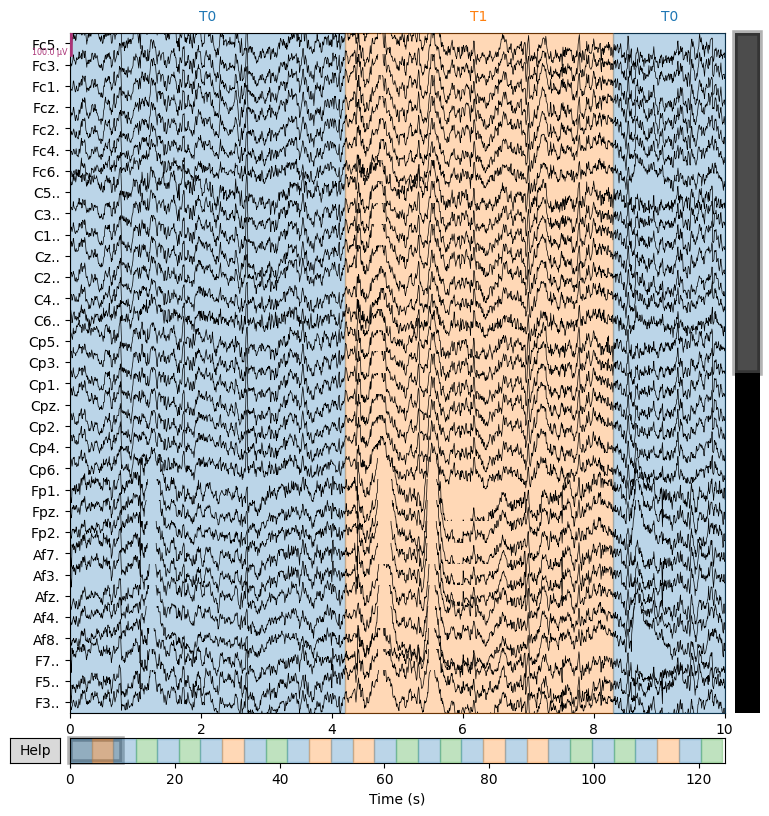

Extracting EDF parameters from /content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/S001/S001R12.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...


<Figure size 500x500 with 0 Axes>

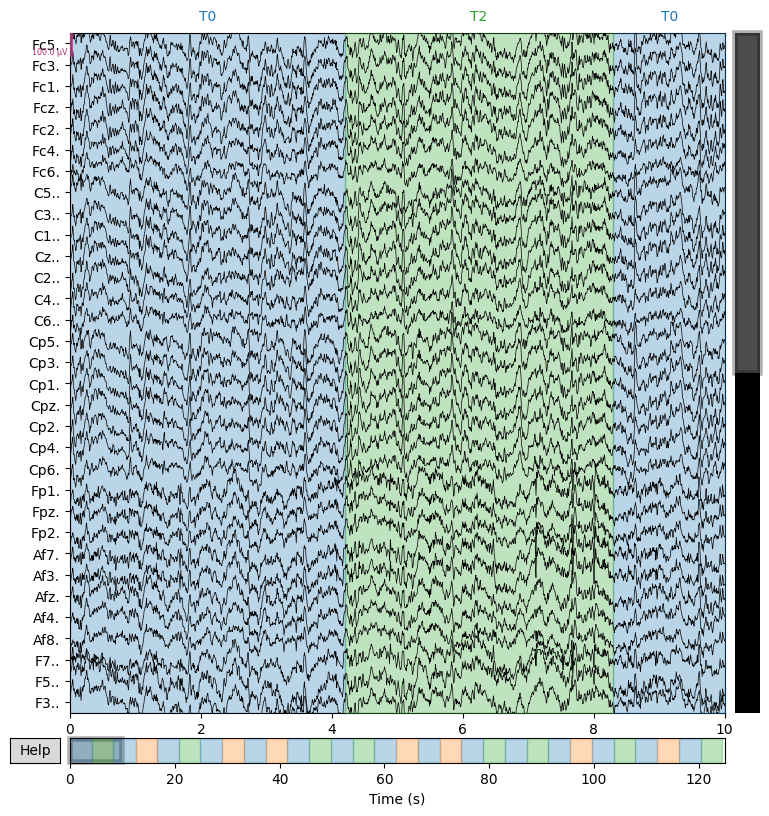

Extracting EDF parameters from /content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/S002/S002R03.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19679  =      0.000 ...   122.994 secs...


<Figure size 500x500 with 0 Axes>

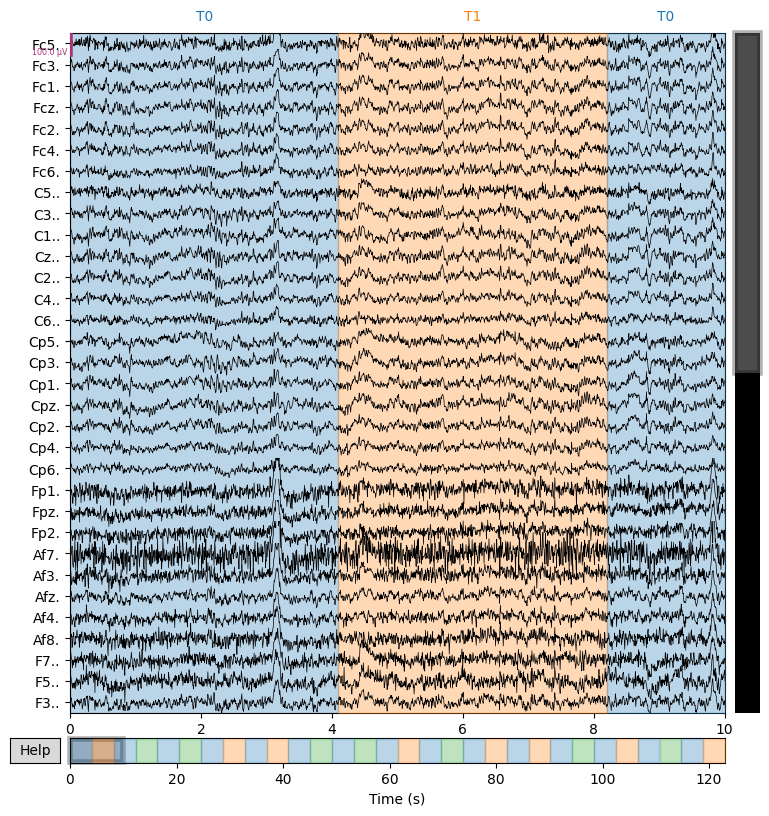

Extracting EDF parameters from /content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/S002/S002R04.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19679  =      0.000 ...   122.994 secs...


Exception ignored in: <function BaseRaw.__del__ at 0x7e9abff19120>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/mne/io/base.py", line 754, in __del__
    def __del__(self):  # noqa: D105
KeyboardInterrupt: 


<Figure size 500x500 with 0 Axes>

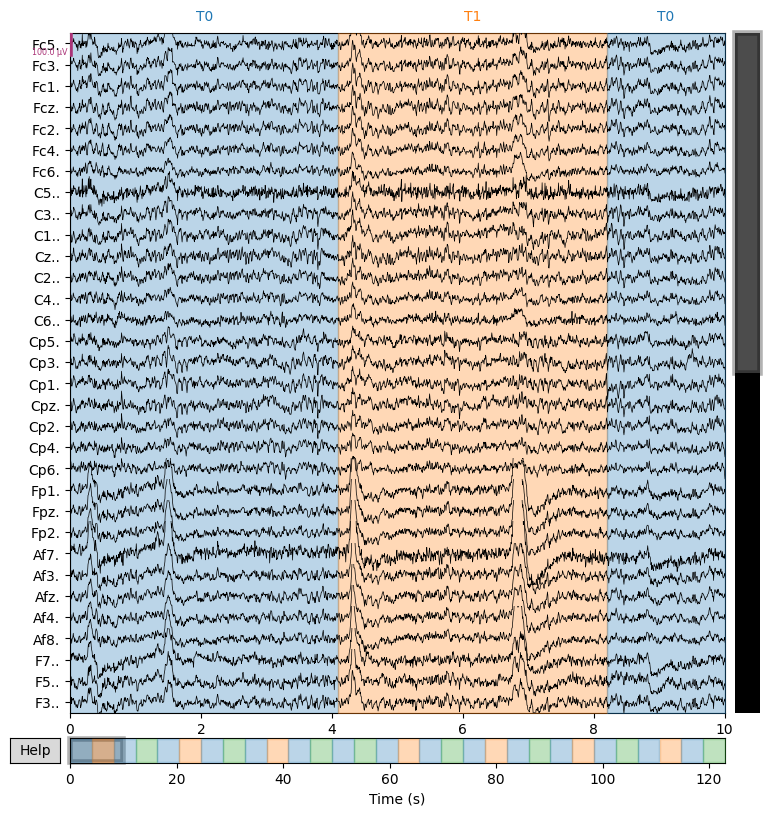

Extracting EDF parameters from /content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/S002/S002R07.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19679  =      0.000 ...   122.994 secs...


KeyboardInterrupt: 

<Figure size 500x500 with 0 Axes>

In [5]:
# Specify the path to the dataset (change this to your actual path)
data_path  = '/content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/'

# Loop over all and analyze all ten subjects.
for subject_id in range(1,10): # change to 109 later
  # Define the runs/sessions you need to analyze
  session_ids = 3,4,7,8,11,12

  # Load the EEG data for each session and plot
  for session_id in (session_ids):  # Assuming there are 6 sessions, in pairs for left and right firsts, adjusted accordingly
      # Load the EEG data using MNE
      raw = mne.io.read_raw_edf(f'{data_path}S{subject_id:03d}/S{subject_id:03d}R{session_id:02d}.edf', preload=True)

      # Plot EEG signals for each session
      plt.figure(figsize=(10, 5))
      raw.plot(n_channels=32, scalings=dict(eeg=50e-6), title=f'Subject {subject_id}, Session {session_id}')

  # Show the plots
  plt.show()

#**Three attempts to plot only T1 and T2 signal intervals**

Extracting EDF parameters from /content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/S001/S001R03.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...


/usr/local/lib/python3.10/dist-packages/scipy/signal/_spectral_py.py:2017: UserWarning: nperseg = 1024 is greater than input length  = 800, using nperseg = 800
  warnings.warn('nperseg = {0:d} is greater than input length '


ValueError: x and y must have same first dimension, but have shapes (401,) and (64, 401)

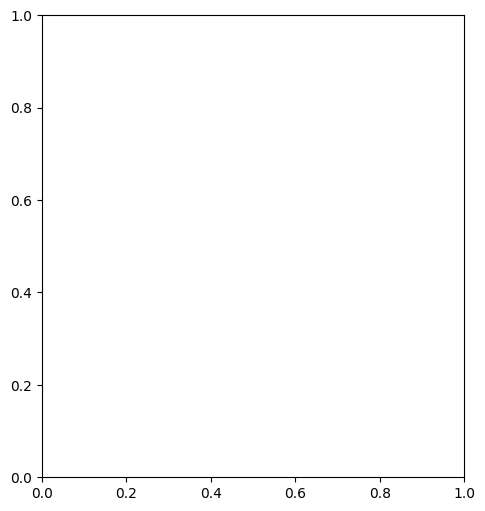

In [ ]:
# Specify the path to the dataset (change this to your actual path)
data_path  = '/content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/'

# Loop over all and analyze all ten subjects.
for subject_id in range(1,10): # change to 109 later
  # Define the runs/sessions you need to analyze
  session_ids = 3,4,7,8,11,12

  # Load the EEG data for each session and plot
  for session_id in (session_ids):  # Assuming there are 6 sessions, in pairs for left and right firsts, adjusted accordingly

    # Load the EEG data using MNE
    raw = mne.io.read_raw_edf(f'{data_path}S{subject_id:03d}/S{subject_id:03d}R{session_id:02d}.edf', preload=True)

    # Define the time ranges for T1 and T2 trials (adjust these based on your experiment)
    t1_start, t1_end = 10, 15  # Example: T1 trials occur from 10 to 15 seconds
    t2_start, t2_end = 20, 25  # Example: T2 trials occur from 20 to 25 seconds

    # Extract data for T1 and T2 trials
    t1_data, _ = raw[:, int(t1_start * raw.info['sfreq']):int(t1_end * raw.info['sfreq'])]
    t2_data, _ = raw[:, int(t2_start * raw.info['sfreq']):int(t2_end * raw.info['sfreq'])]

    # Calculate power spectral density using Welch's method for T1 trials
    f_t1, Pxx_t1 = welch(t1_data, fs=raw.info['sfreq'], nperseg=1024)

    # Calculate power spectral density using Welch's method for T2 trials
    f_t2, Pxx_t2 = welch(t2_data, fs=raw.info['sfreq'], nperseg=1024)

    # Plot power spectral density for T1 and T2 trials
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.plot(f_t1, 10 * np.log10(Pxx_t1), label='T1 Trials')
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Power/Frequency (dB/Hz)')
    plt.title('Power Spectral Density - T1 Trials')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(f_t2, 10 * np.log10(Pxx_t2), label='T2 Trials')
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Power/Frequency (dB/Hz)')
    plt.title('Power Spectral Density - T2 Trials')
    plt.legend()

    plt.tight_layout()
    plt.show()

In [ ]:
# Specify the path to the dataset (change this to your actual path)
data_path  = '/content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/'

# Loop over all and analyze all ten subjects.
for subject_id in range(1,10): # change to 109 later
  # Define the runs/sessions you need to analyze
  session_ids = 3,4,7,8,11,12

  # Load the EEG data for each session and plot
  for session_id in (session_ids):  # Assuming there are 6 sessions, in pairs for left and right firsts, adjusted accordingly

    # Load the EEG data using MNE
    raw = mne.io.read_raw_edf(f'{data_path}S{subject_id:03d}/S{subject_id:03d}R{session_id:02d}.edf', preload=True)

    # Define the time ranges for T1 and T2 trials (adjust these based on your experiment)
    t1_start, t1_end = 10, 15  # Example: T1 trials occur from 10 to 15 seconds
    t2_start, t2_end = 20, 25  # Example: T2 trials occur from 20 to 25 seconds

    # Extract data for T1 and T2 trials
    t1_data, _ = raw[:, int(t1_start * raw.info['sfreq']):int(t1_end * raw.info['sfreq'])]
    t2_data, _ = raw[:, int(t2_start * raw.info['sfreq']):int(t2_end * raw.info['sfreq'])]

    # Calculate power spectral density using Welch's method for T1 trials
    f_t1, Pxx_t1 = welch(t1_data, fs=raw.info['sfreq'], nperseg=1024)

    # Calculate power spectral density using Welch's method for T2 trials
    f_t2, Pxx_t2 = welch(t2_data, fs=raw.info['sfreq'], nperseg=1024)

    # Interpolate power arrays to a common frequency grid
    f_common = np.linspace(min(f_t1[0], f_t2[0]), max(f_t1[-1], f_t2[-1]), len(f_t1))
    interp_t1 = np.interp(f_common, f_t1, Pxx_t1)
    interp_t2 = np.interp(f_common, f_t2, Pxx_t2)

    # Plot power spectral density for T1 and T2 trials
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.plot(f_common, 10 * np.log10(interp_t1), label='T1 Trials')
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Power/Frequency (dB/Hz)')
    plt.title('Power Spectral Density - T1 Trials')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(f_common, 10 * np.log10(interp_t2), label='T2 Trials')
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Power/Frequency (dB/Hz)')
    plt.title('Power Spectral Density - T2 Trials')
    plt.legend()

    plt.tight_layout()
    plt.show()

Extracting EDF parameters from /content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/S001/S001R03.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...


ValueError: object too deep for desired array

Extracting EDF parameters from /content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/S001/S001R03.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...


ValueError: x and y must have same first dimension, but have shapes (401,) and (64, 401)

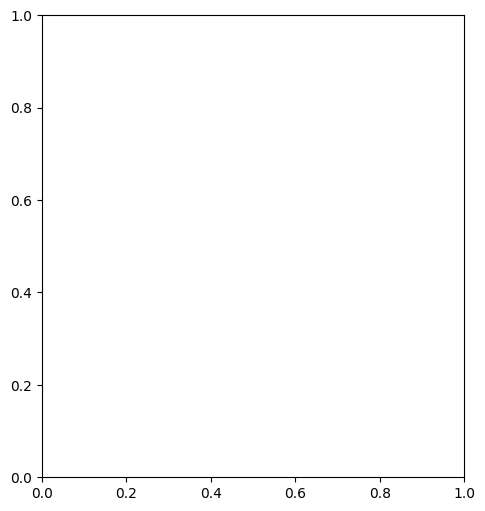

In [ ]:
from scipy.interpolate import interp1d

# Specify the path to the dataset (change this to your actual path)
data_path  = '/content/gdrive/MyDrive/BKP/TCC/Datasets/eegmmidb/'

# Loop over all and analyze all ten subjects.
for subject_id in range(1,10): # change to 109 later
  # Define the runs/sessions you need to analyze
  session_ids = 3,4,7,8,11,12

  # Load the EEG data for each session and plot
  for session_id in (session_ids):  # Assuming there are 6 sessions, in pairs for left and right firsts, adjusted accordingly

    # Load the EEG data using MNE
    raw = mne.io.read_raw_edf(f'{data_path}S{subject_id:03d}/S{subject_id:03d}R{session_id:02d}.edf', preload=True)

    # Define the time ranges for T1 and T2 trials (adjust these based on your experiment)
    t1_start, t1_end = 10, 15  # Example: T1 trials occur from 10 to 15 seconds
    t2_start, t2_end = 20, 25  # Example: T2 trials occur from 20 to 25 seconds

    # Extract data for T1 and T2 trials
    t1_data, _ = raw[:, int(t1_start * raw.info['sfreq']):int(t1_end * raw.info['sfreq'])]
    t2_data, _ = raw[:, int(t2_start * raw.info['sfreq']):int(t2_end * raw.info['sfreq'])]

    # Calculate power spectral density using Welch's method for T1 trials
    f_t1, Pxx_t1 = welch(t1_data, fs=raw.info['sfreq'], nperseg=1024)

    # Calculate power spectral density using Welch's method for T2 trials
    f_t2, Pxx_t2 = welch(t2_data, fs=raw.info['sfreq'], nperseg=1024)

    # Interpolate power arrays to a common frequency grid
    f_common = np.linspace(min(min(f_t1), min(f_t2)), max(max(f_t1), max(f_t2)), len(f_t1))
    interp_t1 = interp1d(f_t1, Pxx_t1, kind='linear', fill_value='extrapolate')(f_common)
    interp_t2 = interp1d(f_t2, Pxx_t2, kind='linear', fill_value='extrapolate')(f_common)

    # Plot power spectral density for T1 and T2 trials
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.plot(f_common, 10 * np.log10(interp_t1), label='T1 Trials')
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Power/Frequency (dB/Hz)')
    plt.title('Power Spectral Density - T1 Trials')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(f_common, 10 * np.log10(interp_t2), label='T2 Trials')
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Power/Frequency (dB/Hz)')
    plt.title('Power Spectral Density - T2 Trials')
    plt.legend()

    plt.tight_layout()
    plt.show()